In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import IPython.display as ipd

import os
import json
import math
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
import importlib
import commons
import utils
from data_utils import TextAudioLoader, TextAudioCollate, TextAudioSpeakerLoader, TextAudioSpeakerCollate
from models import SynthesizerTrn
from text_JP.symbols import symbols as jpn_symbols # text_JPのsymbolsを使用
from text_JP.phonemize import Phonemizer # Phonemizerをインポート

from scipy.io.wavfile import write



# Phonemizerの初期化とシンボルIDへのマッピング
_phonemizer = Phonemizer()
_symbol_to_id = {s: i for i, s in enumerate(jpn_symbols)}

def _symbols_to_sequence(symbols_list):
    sequence = []
    for s in symbols_list:
        if s in _symbol_to_id:
            sequence.append(_symbol_to_id[s])
    return sequence

def get_text(text, hps):
    # Phonemizerを使用してテキストを音素列に変換
    phonemes_str = _phonemizer(text) # 例: "k o N n i t i h a"
    phonemes_list = phonemes_str.split(' ') # 例: ["k", "o", "N", "n", "i", "t", "i", "h", "a"]

    # 音素列をIDのシーケンスに変換
    text_norm = _symbols_to_sequence(phonemes_list)
    
    if hps.data.add_blank:
        text_norm = commons.intersperse(text_norm, 0)
    text_norm = torch.LongTensor(text_norm)
    return text_norm


In [5]:
import re
import time
import pyopenjtalk
from text_JP.phonemize import Phonemizer

# Initialize Phonemizer
phonemizer = Phonemizer()

def japanese_cleaner_revised(text):
    # This cleaner uses pyopenjtalk to get katakana and then the original phonemizer.
    # It handles special tokens correctly.

    # 1. Split text by special tokens, keeping them as delimiters.
    parts = re.split(r'({cough}|<cough>|\[.*?\]|[、。])', text)
    
    phoneme_parts = []
    for part in parts:
        if not part or part.isspace():
            continue

        # a. Handle special tokens
        if part.startswith('[') and part.endswith(']'):
            content = part[1:-1]
            # Get kana, then phonemize content
            if not content:
                phoneme_parts.append('[ ]')
            else:
                kana_content = pyopenjtalk.g2p(content, kana=True).replace('ヲ', 'オ')
                phoneme_content = phonemizer(kana_content)
                phoneme_parts.append(f'[ {phoneme_content} ]')
            continue

        if part == '{cough}' or part == '<cough>':
            phoneme_parts.append('<cough>')
            continue
            
        if part in '、。':
            phoneme_parts.append('sp')
            continue

        # b. For normal text, get kana and then phonemize
        kana = pyopenjtalk.g2p(part, kana=True).replace('ヲ', 'オ')
        phonemes = phonemizer(kana)
        phoneme_parts.append(phonemes)

    # 3. Join and clean up spaces
    final_text = ' '.join(phoneme_parts)
    return re.sub(r'\s+', ' ', final_text).strip()

In [7]:
# Configuration and Model Loading
# UUDBモデルの設定ファイルを使用
hps = utils.get_hparams_from_file("./logs/uudb_csj21/config.json")
device = "cpu"
net_g = SynthesizerTrn(
    len(jpn_symbols), # jpn_symbolsを使用
    hps.data.filter_length // 2 + 1,
    hps.train.segment_size // hps.data.hop_length,
    n_speakers=hps.data.n_speakers,  # ★ これを明示的に渡す！
    **hps.model).to(device)
_ = net_g.eval()

# UUDBモデルのチェックポイントを使用
_ = utils.load_checkpoint("./logs/uudb_csj21/G_1030000.pth", net_g, None)


# Load text module and symbols
text_module = importlib.import_module(hps.data.text_module)
cleaned_text_to_sequence = text_module.cleaned_text_to_sequence
symbols = text_module.symbols

Mutli-stream iSTFT VITS


/home/synology/naru/work/ms2/MB-iSTFT-VITS/utils.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')


In [8]:
# Generate full latent representation and then synthesize only the first half
# 日本語のカタカナテキストを入力
text = "[ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて"


# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst)

start_time=time.time()
with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    # Perform inference to get the full latent representation (z) and mask (y_mask)
    # The infer method returns: o, o_mb, attn, y_mask, (z, z_p, m_p, logs_p)
    _, _, _, y_mask, (z, _, _, _), timings = net_g.infer(x_tst, x_tst_lengths, noise_scale=.667, noise_scale_w=0.8, length_scale=1)

    # Determine the length for the first half of the latent representation
    # We take half of the sequence length of z
    half_len = z.shape[2] // 30
    
    
    # Slice the latent representation (z) and its corresponding mask (y_mask)
    z_partial = z[:, :, :half_len]
    y_mask_partial = y_mask[:, :, :half_len]

    # Directly call the decoder (net_g.dec) with the partial latent representation
    # The 'g' parameter (speaker embedding) is None in this single-speaker example
    audio_partial_first, _ = net_g.dec((z_partial * y_mask_partial), g=None)
    
    # Convert the generated audio tensor to a numpy array for playback
    audio_partial_first = audio_partial_first[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_partial_first) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration

print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")
# Display the synthesized partial audio
ipd.display(ipd.Audio(audio_partial_first, rate=hps.data.sampling_rate, normalize=False))

print("Component-wise breakdown (of Inference time):")

# 合計時間を計算
total_time = sum(timings.values())

# 'timings' ディクショナリをループ処理
for component, time_taken in timings.items():
    # 各コンポーネントのパーセンテージを計算
    percentage = (time_taken / total_time) * 100
    
    # f-string を使って、左揃え・桁揃えで表示
    # {component:<25} : 25文字分の幅を確保し、左揃え
    # {time_taken:.4f} : 小数点以下4桁
    # {percentage:5.2f} : 全体で5文字（小数点含む）、小数点以下2桁
    print(f"- {component:<25}: {time_taken:.4f} sec ({percentage:5.2f}%)")

print("---------------------------------------------")
print(f"- {'Total':<25}: {total_time:.4f} sec (100.00%)")

Original text: [ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて
Phonemized (revised): [ a ] zy a: sp s a i sy o w a sp e: t o [ s o n o ] sp k o: b a N n o s o t o n i s a r a r i: m a N g a i t e
Mora Count: 18
--------------------


TypeError: embedding(): argument 'indices' (position 2) must be Tensor, not NoneType

In [35]:
 # Generate full latent representation and then synthesize only the second half
# 日本語のカタカナテキストを入力 (前半部分と同じテキストを使用)
text_second_half = "[ あ ] じゃあ、最初は、えーの[ その ] 、 交番の外にサラリーマンがいて"

# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst_second_half = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst_second_half = commons.intersperse(stn_tst_second_half, 0)
stn_tst_second_half = torch.LongTensor(stn_tst_second_half)

start_time=time.time()

with torch.no_grad():
    x_tst_second_half = stn_tst_second_half.unsqueeze(0)
    x_tst_lengths_second_half = torch.LongTensor([stn_tst_second_half.size(0)])
    
    # Perform inference to get the full latent representation (z) and mask (y_mask)
    _, _, _, y_mask_full, (z_full, _, _, _), timings = net_g.infer(x_tst_second_half, x_tst_lengths_second_half, noise_scale=.667, noise_scale_w=0.8, length_scale=1)

    # Determine the length for the second half of the latent representation
    full_len = z_full.shape[2]
    half_len_start = full_len // 2 # 後半の開始インデックス
    
    # Slice the latent representation (z) and its corresponding mask (y_mask) for the second half
    z_second_half = z_full[:, :, half_len_start:]
    y_mask_second_half = y_mask_full[:, :, half_len_start:]

    # Directly call the decoder (net_g.dec) with the partial latent representation
    audio_second_half, _ = net_g.dec((z_second_half * y_mask_second_half), g=None)
    
    # Convert the generated audio tensor to a numpy array for playback
    audio_second_half = audio_second_half[0,0].data.cpu().float().numpy()
    
end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_second_half) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration
print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")
# Display the synthesized second half audio
ipd.display(ipd.Audio(audio_second_half, rate=hps.data.sampling_rate, normalize=False))

print("Component-wise breakdown (of Inference time):")

# 合計時間を計算
total_time = sum(timings.values())

# 'timings' ディクショナリをループ処理
for component, time_taken in timings.items():
    # 各コンポーネントのパーセンテージを計算
    percentage = (time_taken / total_time) * 100
    
    # f-string を使って、左揃え・桁揃えで表示
    # {component:<25} : 25文字分の幅を確保し、左揃え
    # {time_taken:.4f} : 小数点以下4桁
    # {percentage:5.2f} : 全体で5文字（小数点含む）、小数点以下2桁
    print(f"- {component:<25}: {time_taken:.4f} sec ({percentage:5.2f}%)")

print("---------------------------------------------")
print(f"- {'Total':<25}: {total_time:.4f} sec (100.00%)")

Original text: [ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて
Phonemized (revised): [ a ] zy a: sp s a i sy o w a sp e: t o [ s o n o ] sp k o: b a N n o s o t o n i s a r a r i: m a N g a i t e
Mora Count: 18
--------------------


TypeError: embedding(): argument 'indices' (position 2) must be Tensor, not NoneType

In [12]:
print("--- Full Synthesis ---")
text_full_compare = "[ あ ] じゃあ、最初は、えーの　[ その ] 、 交番の外にサラリーマンがいて"


# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")



stn_tst_full_compare = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst_full_compare = commons.intersperse(stn_tst_full_compare, 0)
stn_tst_full_compare = torch.LongTensor(stn_tst_full_compare)

start_time=time.time()

with torch.no_grad():
    x_tst_full_compare = stn_tst_full_compare.unsqueeze(0)
    x_tst_lengths_full_compare = torch.LongTensor([stn_tst_full_compare.size(0)])
    # 【修正1】 .to(device) を追加してデバイスを合わせる
    sid = torch.LongTensor([375]).to(device)
    # audio_full (最初) と timings (最後) だけ受け取り、間は無視する
    audio_full, *_, timings = net_g.infer(x_tst_full_compare, x_tst_lengths_full_compare, sid=sid, noise_scale=.667, noise_scale_w=0.8, length_scale=1)
    audio_full = audio_full[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_full) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration
print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")
ipd.display(ipd.Audio(audio_full, rate=hps.data.sampling_rate, normalize=False))

--- Full Synthesis ---
Original text: [ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて
Phonemized (revised): [ a ] zy a: sp s a i sy o w a sp e: t o [ s o n o ] sp k o: b a N n o s o t o n i s a r a r i: m a N g a i t e
Mora Count: 18
--------------------
Audio duration: 4.83 seconds
Elapsed time: 0.11 seconds
Real Time Factor (RTF): 0.0222


--- Full Synthesis ---
Original text: [ あ ] じゃあ、最初は、えーの[ その ] 、 交番の外にサラリーマンがいて
Phonemized (revised): [ a ] zy a: sp s a i sy o w a sp e: n o [ s o n o ] sp k o: b a N n o s o t o n i s a r a r i: m a N g a i t e
Mora Count: 18
--------------------
Audio duration: 4.66 seconds
Elapsed time: 0.12 seconds
Real Time Factor (RTF): 0.0256



--- 📈 Phase Analysis (Full Synthesis) ---


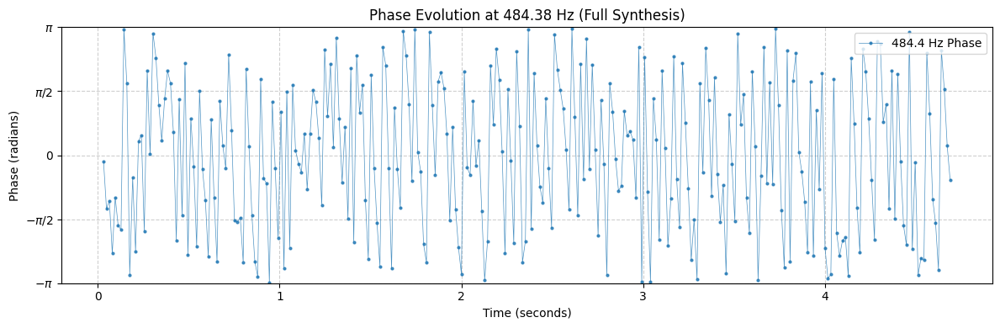

In [14]:
import matplotlib.pyplot as plt
import librosa
import numpy as np
import re
import torch
import time
import IPython.display as ipd

# --- 前回の位相プロット関数を定義 (未定義の場合に備えて再掲) ---
def plot_phase_time_series(audio_data, sr, title_suffix="", target_freq=500, search_width_hz=100):
    n_fft = 1024
    hop_length = 256
    D = librosa.stft(audio_data, n_fft=n_fft, hop_length=hop_length)
    magnitude = np.abs(D)
    phase = np.angle(D)
    
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # ターゲット周波数周辺で最もエネルギーが高いビンを探す
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width_hz)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width_hz)))
    target_band_magnitude = np.mean(magnitude[idx_start:idx_end, :], axis=1)
    best_bin_idx = idx_start + np.argmax(target_band_magnitude)
    best_freq = freqs[best_bin_idx]
    
    phase_track = phase[best_bin_idx, :]
    times = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=hop_length, n_fft=n_fft)

    plt.figure(figsize=(12, 4))
    plt.plot(times, phase_track, label=f'{best_freq:.1f} Hz Phase', marker='o', markersize=2, linewidth=0.5, alpha=0.8)
    plt.title(f"Phase Evolution at {best_freq:.2f} Hz {title_suffix}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Phase (radians)")
    plt.ylim(-np.pi, np.pi)
    plt.yticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# ==========================================
# ユーザーご提示の生成コード (変数名修正版)
# ==========================================

print("--- Full Synthesis ---")
text_full_compare = "[ あ ] じゃあ、最初は、えーの[ その ] 、 交番の外にサラリーマンがいて"

# 【修正】text変数が見当たらないため、text_full_compareを使用するように変更
phonemized_text = japanese_cleaner_revised(text_full_compare)

# For display purposes
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text_full_compare), kana=True)
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text_full_compare}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst_full_compare = cleaned_text_to_sequence(phonemized_text)

if hps.data.add_blank:
    stn_tst_full_compare = commons.intersperse(stn_tst_full_compare, 0)
stn_tst_full_compare = torch.LongTensor(stn_tst_full_compare)

start_time = time.time()

with torch.no_grad():
    # デバイス転送を追加
    x_tst_full_compare = stn_tst_full_compare.unsqueeze(0).to(device)
    x_tst_lengths_full_compare = torch.LongTensor([stn_tst_full_compare.size(0)]).to(device)
    
    sid = torch.LongTensor([375]).to(device)
    
    # 推論実行
    audio_full, *_, timings = net_g.infer(
        x_tst_full_compare, 
        x_tst_lengths_full_compare, 
        sid=sid, 
        noise_scale=.667, 
        noise_scale_w=0.8, 
        length_scale=1
    )
    audio_full = audio_full[0,0].data.cpu().float().numpy()
    # audio_full (最初) と timings (最後) だけ受け取り、間は無視する


end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_full) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration

print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")

ipd.display(ipd.Audio(audio_full, rate=hps.data.sampling_rate, normalize=False))

# ==========================================
# ★ 追加: 位相スペクトル(時間変化)のプロット
# ==========================================
print("\n--- 📈 Phase Analysis (Full Synthesis) ---")
plot_phase_time_series(
    audio_full, 
    hps.data.sampling_rate, 
    title_suffix="(Full Synthesis)", 
    target_freq=500
)

In [21]:
print("\n--- Visual Comparison (Waveforms) ---")
plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
plt.plot(audio_full)
plt.title("Full Synthesis")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")

plt.subplot(3, 1, 2)
plt.plot(audio_partial_first)
plt.title("First Half Synthesis")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")

plt.subplot(3, 1, 3)
plt.plot(audio_second_half)
plt.title("Second Half Synthesis")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()


--- Visual Comparison (Waveforms) ---


In [7]:
# 日本語のカタカナテキストを入力
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"
phonemized_text = japanese_cleaner_revised(text)

stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst)


# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))
print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

start_time = time.time()
with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    noise_scale = 0.667
    noise_scale_w = 0.8
    length_scale = 1

    # Step 1: テキスト全体から分布パラメータ(m_p, logs_p)を取得
    # net_g.inferの返り値から、zではなくm_pとlogs_pを受け取る
    _, _, _, y_mask, (_, _, m_p, logs_p) = net_g.infer(
        x_tst, 
        x_tst_lengths, 
        noise_scale=noise_scale, 
        noise_scale_w=noise_scale_w, 
        length_scale=length_scale
    )

    # Step 2: 分布パラメータとマスクをスライス
    half_len = m_p.shape[2] // 2
    
    m_p_partial = m_p[:, :, :half_len]
    logs_p_partial = logs_p[:, :, :half_len]
    y_mask_partial = y_mask[:, :, :half_len]

    # Step 3: スライスしたパラメータから、潜在表現zを新たにサンプリング
    # torch.randn_likeでm_p_partialと同じ形状の乱数を生成する
    z_sampled_partial = (m_p_partial + torch.randn_like(m_p_partial) * torch.exp(logs_p_partial) * noise_scale) * y_mask_partial

    # Step 4: 新しくサンプリングしたzをデコーダに入力
    audio_partial, _ = net_g.dec(z_sampled_partial, g=None)
    
    audio_partial = audio_partial[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_partial) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration

print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")

ipd.display(ipd.Audio(audio_partial, rate=hps.data.sampling_rate, normalize=False))

Original text: 最近、インターステラーを見たのですけど、すごく面白かったです。
Phonemized (revised): s a i k i N sp i N t a: s u t e r a: o m i t a n o d e s u k e d o sp s u g o k u o m o s i r o k a Q t a d e s u sp
Mora Count: 35
--------------------
Audio duration: 2.40 seconds
Elapsed time: 0.22 seconds
Real Time Factor (RTF): 0.0934


In [64]:
# 日本語のカタカナテキストを入力
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"
phonemized_text = japanese_cleaner_revised(text)

stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst)

start_time = time.time()
with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    noise_scale = 0.667
    noise_scale_w = 0.8
    length_scale = 1

    # Step 1: テキスト全体から分布パラメータ(m_p, logs_p)を取得
    _, _, _, y_mask, (_, _, m_p, logs_p) = net_g.infer(
        x_tst, 
        x_tst_lengths, 
        noise_scale=noise_scale, 
        noise_scale_w=noise_scale_w, 
        length_scale=length_scale
    )

    # Step 2: 分布パラメータとマスクを後半部分でスライス
    # 🌟 この部分を変更しました 🌟
    half_len = m_p.shape[2] // 2
    
    m_p_partial = m_p[:, :, half_len:] # :half_len -> half_len:
    logs_p_partial = logs_p[:, :, half_len:] # :half_len -> half_len:
    y_mask_partial = y_mask[:, :, half_len:] # :half_len -> half_len:

    # Step 3: スライスしたパラメータから、潜在表現zを新たにサンプリング
    z_sampled_partial = (m_p_partial + torch.randn_like(m_p_partial) * torch.exp(logs_p_partial) * noise_scale) * y_mask_partial

    # Step 4: 新しくサンプリングしたzをデコーダに入力
    audio_partial, _ = net_g.dec(z_sampled_partial, g=None)
    
    audio_partial = audio_partial[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_partial) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration

print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")

# 生成された後半部分の音声を表示
ipd.display(ipd.Audio(audio_partial, rate=hps.data.sampling_rate, normalize=False))

Audio duration: 2.40 seconds
Elapsed time: 1.16 seconds
Real Time Factor (RTF): 0.4829


In [18]:
# Generate full latent representation and then synthesize only the first half
# 日本語のカタカナテキストを入力
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"


# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst)

start_time=time.time()
with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    # Perform inference to get the full latent representation (z) and mask (y_mask)
    # The infer method returns: o, o_mb, attn, y_mask, (z, z_p, m_p, logs_p)
    # Directly call the Prior Encoder (enc_p)
    # This generates 'z' from 'x_tst' but SKIPS the Decoder
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(x_tst, x_tst_lengths, noise_scale=.667, noise_scale_w=0.8, length_scale=1)

    # Determine the length for the first half of the latent representation
    # We take half of the sequence length of z
    half_len = z.shape[2] // 20
    
    
    # Slice the latent representation (z) and its corresponding mask (y_mask)
    z_partial = z[:, :, :half_len]
    y_mask_partial = y_mask[:, :, :half_len]

    # Directly call the decoder (net_g.dec) with the partial latent representation
    # The 'g' parameter (speaker embedding) is None in this single-speaker example
    audio_partial_first, _ = net_g.dec((z_partial * y_mask_partial), g=None)
    
    # Convert the generated audio tensor to a numpy array for playback
    audio_partial_first = audio_partial_first[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_partial_first) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration

print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")
# Display the synthesized partial audio
ipd.display(ipd.Audio(audio_partial_first, rate=hps.data.sampling_rate, normalize=False))

Original text: 最近、インターステラーを見たのですけど、すごく面白かったです。
Phonemized (revised): s a i k i N sp i N t a: s u t e r a: o m i t a n o d e s u k e d o sp s u g o k u o m o s i r o k a Q t a d e s u sp
Mora Count: 35
--------------------
Audio duration: 0.24 seconds
Elapsed time: 0.05 seconds
Real Time Factor (RTF): 0.2138


In [42]:


# (これより上は、元のコードの 'stn_tst = ...' までの前処理)
# stn_tst = torch.LongTensor(stn_tst)
# hps.data.sampling_rate が定義されている前提
# Generate full latent representation and then synthesize only the first half
# 日本語のカタカナテキストを入力
text = "[ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて"


# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst)


# --- ここからが変更後のコード ---

# ▼▼▼ 変更可能なパラメータ ▼▼▼
# 分割する割合 (例: 0.5 = 50% の位置で分割, 0.3 = 30%)
split_ratio = 0.05
# ▲▲▲ 変更可能なパラメータ ▲▲▲

print(f"Splitting latent representation at {split_ratio * 100:.0f}%...")
print("--------------------")

# 1. 全体の処理時間を計測開始
total_start_time = time.time() 

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    # 2. z (潜在表現) の全体を生成 (Prior Encoder)
    z_gen_start_time = time.time()
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, sid=sid,
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
    z_gen_time = time.time() - z_gen_start_time
    print(f"Time for infer_z_only (Prior Encoder): {z_gen_time:.4f} sec")
    print("--------------------")

    # 3. 潜在表現 z を指定の割合で2つに分割
    full_len = z.shape[2]
    split_point = int(full_len * split_ratio)

    if split_point == 0:
        print("Warning: split_point is 0. Part 1 will be empty.")
    if split_point >= full_len:
         print("Warning: split_point is at or beyond the end. Part 2 will be empty.")

    # 1つ目のセグメント
    z_part1 = z[:, :, :split_point]
    y_mask_part1 = y_mask[:, :, :split_point]

    # 2つ目のセグメント (残り)
    z_part2 = z[:, :, split_point:]
    y_mask_part2 = y_mask[:, :, split_point:]

    # 4. 1つ目のセグメントをデコード (時間計測)
    print("Decoding Part 1...")
    dec_start_1 = time.time()
    # z_part1 が空でないことを確認
    if z_part1.shape[2] > 0:
        audio_part1, _ = net_g.dec((z_part1 * y_mask_part1), g=None)
        audio_part1_np = audio_part1[0,0].data.cpu().float().numpy()
    else:
        audio_part1_np = np.array([], dtype=np.float32) # 空の配列
    dec_time_1 = time.time() - dec_start_1
    
    print(f"Time for Decoder (Part 1): {dec_time_1:.4f} sec")

    # 5. 2つ目のセグメントをデコード (時間計測)
    print("Decoding Part 2...")
    dec_start_2 = time.time()
    # z_part2 が空でないことを確認
    if z_part2.shape[2] > 0:
        audio_part2, _ = net_g.dec((z_part2 * y_mask_part2), g=None)
        audio_part2_np = audio_part2[0,0].data.cpu().float().numpy()
    else:
        audio_part2_np = np.array([], dtype=np.float32) # 空の配列
    dec_time_2 = time.time() - dec_start_2
    
    print(f"Time for Decoder (Part 2): {dec_time_2:.4f} sec")
    print("--------------------")

# 6. 全体の処理時間を計算
total_elapsed_time = time.time() - total_start_time
print(f"Total Elapsed Time (z_gen + dec1 + dec2): {total_elapsed_time:.4f} sec")
print("--------------------")

# 7. 音声を結合
audio_combined = np.concatenate((audio_part1_np, audio_part2_np))

# 8. 各音声を表示
print("--- 🎧 Audio (Part 1) ---")
ipd.display(ipd.Audio(audio_part1_np, rate=hps.data.sampling_rate, normalize=False))

print("\n--- 🎧 Audio (Part 2) ---")
ipd.display(ipd.Audio(audio_part2_np, rate=hps.data.sampling_rate, normalize=False))

print("\n--- 🎧 Audio (Combined) ---")
ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Original text: [ あ ] じゃあ、最初は、えーと[ その ] 、 交番の外にサラリーマンがいて
Phonemized (revised): [ a ] zy a: sp s a i sy o w a sp e: t o [ s o n o ] sp k o: b a N n o s o t o n i s a r a r i: m a N g a i t e
Mora Count: 18
--------------------
Splitting latent representation at 5%...
--------------------
Time for infer_z_only (Prior Encoder): 0.0398 sec
--------------------
Decoding Part 1...
Time for Decoder (Part 1): 0.0188 sec
Decoding Part 2...
Time for Decoder (Part 2): 0.1079 sec
--------------------
Total Elapsed Time (z_gen + dec1 + dec2): 0.1668 sec
--------------------
--- 🎧 Audio (Part 1) ---



--- 🎧 Audio (Part 2) ---



--- 🎧 Audio (Combined) ---


In [44]:

# --- ここからが変更後のコード ---

# ▼▼▼ 変更可能なパラメータ ▼▼▼
# 分割したい「位置」の割合をリストで指定 (0.0 < r < 1.0)
# - [0.5] -> 2分割 (50%の位置で)
# - [0.3, 0.8] -> 3分割 (30%の位置と80%の位置で)
# - [0.25, 0.5, 0.75] -> 4分割
split_points_ratios = [0.25, 0.5, 0.75]
# ▲▲▲ 変更可能なパラメータ ▲▲▲

# 念のため割合をソートし、重複を削除
split_points_ratios = sorted(list(set(r for r in split_points_ratios if 0.0 < r < 1.0)))

print(f"Splitting into {len(split_points_ratios) + 1} segments at: {[f'{r*100:.0f}%' for r in split_points_ratios]}")
print("--------------------")

# 1. 全体の処理時間を計測開始
total_start_time = time.time() 



# 結果を格納するリスト
decoding_times = []
decoded_audios_np = []

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    # 2. z (潜在表現) の全体を生成 (Prior Encoder)
    print("Generating full latent representation (z)...")
    z_gen_start_time = time.time()
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, sid=sid,
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
    z_gen_time = time.time() - z_gen_start_time
    print(f"Time for infer_z_only (Prior Encoder): {z_gen_time:.4f} sec")
    print("--------------------")

    # 3. 潜在表現 z を N個 に分割
    full_len = z.shape[2]

    # [0.25, 0.5, 0.75] -> [0, 250, 500, 750, 1000] (full_len=1000の場合)
    split_indices_abs = [int(r * full_len) for r in split_points_ratios]
    all_split_indices = [0] + split_indices_abs + [full_len]

    # 4. 各セグメントを個別にデコード
    print("Decoding segments individually...")
    for i in range(len(all_split_indices) - 1):
        start_idx = all_split_indices[i]
        end_idx = all_split_indices[i+1]
        
        print(f"  Segment {i+1}/{len(all_split_indices)-1} (z-index {start_idx} to {end_idx})...")

        # スライス実行
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]

        # デコード時間を計測
        dec_start = time.time()
        if z_part.shape[2] > 0:
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            audio_part_np = audio_part[0,0].data.cpu().float().numpy()
        else:
            audio_part_np = np.array([], dtype=np.float32) # 空のセグメント
        dec_time = time.time() - dec_start
        
        decoding_times.append(dec_time)
        decoded_audios_np.append(audio_part_np)
        print(f"  Time for Decoder (Part {i+1}): {dec_time:.4f} sec")

# 5. 全体の処理時間を計算
total_elapsed_time = time.time() - total_start_time
print("--------------------")
print(f"Total Decoder Time (Sum of parts): {sum(decoding_times):.4f} sec")
print(f"Total Elapsed Time (z_gen + all_decs): {total_elapsed_time:.4f} sec")
print("--------------------------------------------------")

# 6. 音声を結合
audio_combined = np.concatenate(decoded_audios_np)

# 7. 各音声を表示
for i, audio_np in enumerate(decoded_audios_np):
    print(f"\n--- 🎧 Audio (Part {i+1}) ---")
    ipd.display(ipd.Audio(audio_np, rate=hps.data.sampling_rate, normalize=False))

print("\n--- 🎧 Audio (Combined) ---")
ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Splitting into 4 segments at: ['25%', '50%', '75%']
--------------------
Generating full latent representation (z)...
Time for infer_z_only (Prior Encoder): 0.0303 sec
--------------------
Decoding segments individually...
  Segment 1/4 (z-index 0 to 66)...
  Time for Decoder (Part 1): 0.0358 sec
  Segment 2/4 (z-index 66 to 132)...
  Time for Decoder (Part 2): 0.0344 sec
  Segment 3/4 (z-index 132 to 198)...
  Time for Decoder (Part 3): 0.0313 sec
  Segment 4/4 (z-index 198 to 264)...
  Time for Decoder (Part 4): 0.0318 sec
--------------------
Total Decoder Time (Sum of parts): 0.1331 sec
Total Elapsed Time (z_gen + all_decs): 0.1640 sec
--------------------------------------------------

--- 🎧 Audio (Part 1) ---



--- 🎧 Audio (Part 2) ---



--- 🎧 Audio (Part 3) ---



--- 🎧 Audio (Part 4) ---



--- 🎧 Audio (Combined) ---


In [27]:
# (stn_tst までの前処理)
# ...

# ▼▼▼ 変更可能なパラメータ ▼▼▼
split_points_ratios = [0.25, 0.5, 0.75]
# ▲▲▲ 変更可能なパラメータ ▲▲▲

# (split_points_ratios のソート処理)
# ...
print(f"Splitting into {len(split_points_ratios) + 1} segments at: {[f'{r*100:.0f}%' for r in split_points_ratios]}")


# --- 挿入するウォームアップ処理 (ここから) ---

print("--------------------")
print("Warming up the GPU (Decoder) beforehand...")
try:
    # モデルが使用するデバイスを取得 (e.g., 'cuda:0' or 'cpu')
    device = next(net_g.parameters()).device 
    
    # zの次元 (inter_channels) をデコーダの定義から取得
    inter_channels = net_g.dec.conv_pre.in_channels
    
    # 非常に小さなダミーデータを作成 (1バッチ, inter_channels次元, 1フレーム)
    z_dummy = torch.randn(1, inter_channels, 1).to(device)
    y_mask_dummy = torch.ones(1, 1, 1).to(device)
    
    with torch.no_grad():
        # デコーダを一度だけ実行して、ライブラリをロードさせる
        _ = net_g.dec((z_dummy * y_mask_dummy), g=None)
    
    # GPU処理の完了を待つ (念のため)
    if device.type == 'cuda':
        torch.cuda.synchronize()
        
    print("Warm-up complete.")
except Exception as e:
    print(f"Warn: Warm-up failed (this is non-critical). Error: {e}")
print("--------------------")

# --- 挿入するウォームアップ処理 (ここまで) ---


# 1. 全体の処理時間を計測開始 (ウォームアップの後)
total_start_time = time.time() 

# (以降の z_gen, デコード処理は同じ)
# ...

Splitting into 4 segments at: ['25%', '50%', '75%']
--------------------
Warming up the GPU (Decoder) beforehand...
Warm-up complete.
--------------------


In [29]:

# --- ここからが変更後のコード ---

# ▼▼▼ 変更可能なパラメータ ▼▼▼
# 分割したい「位置」の割合をリストで指定 (0.0 < r < 1.0)
# - [0.5] -> 2分割 (50%の位置で)
# - [0.3, 0.8] -> 3分割 (30%の位置と80%の位置で)
# - [0.25, 0.5, 0.75] -> 4分割
split_points_ratios = [0.01, 0.02, 0.03, 0.04,0.05,0.06,0.07,0.08,0.09,0.10,0.11, 0.12, 0.13, 0.14,0.15,0.16,0.17,0.18,0.19,0.20,0.21, 0.22, 0.23, 0.24,0.25,0.26,0.27,0.28,0.29,0.30,0.31, 0.32, 0.33, 0.34,0.35,0.36,0.37,0.38,0.39,0.40,0.41, 0.42, 0.43, 0.44,0.45,0.46,0.47,0.48,0.49,0.50,0.51, 0.52, 0.53, 0.54,0.55,0.56,0.57,0.58,0.59,0.60,]
# ▲▲▲ 変更可能なパラメータ ▲▲▲

# 念のため割合をソートし、重複を削除
split_points_ratios = sorted(list(set(r for r in split_points_ratios if 0.0 < r < 1.0)))

print(f"Splitting into {len(split_points_ratios) + 1} segments at: {[f'{r*100:.0f}%' for r in split_points_ratios]}")
print("--------------------")

# 1. 全体の処理時間を計測開始
total_start_time = time.time() 



# 結果を格納するリスト
decoding_times = []
decoded_audios_np = []

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
    
    # 2. z (潜在表現) の全体を生成 (Prior Encoder)
    print("Generating full latent representation (z)...")
    z_gen_start_time = time.time()
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
    z_gen_time = time.time() - z_gen_start_time
    print(f"Time for infer_z_only (Prior Encoder): {z_gen_time:.4f} sec")
    print("--------------------")

    # 3. 潜在表現 z を N個 に分割
    full_len = z.shape[2]

    # [0.25, 0.5, 0.75] -> [0, 250, 500, 750, 1000] (full_len=1000の場合)
    split_indices_abs = [int(r * full_len) for r in split_points_ratios]
    all_split_indices = [0] + split_indices_abs + [full_len]

    # 4. 各セグメントを個別にデコード
    print("Decoding segments individually...")
    for i in range(len(all_split_indices) - 1):
        start_idx = all_split_indices[i]
        end_idx = all_split_indices[i+1]
        
        print(f"  Segment {i+1}/{len(all_split_indices)-1} (z-index {start_idx} to {end_idx})...")

        # スライス実行
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]

        # デコード時間を計測
        dec_start = time.time()
        if z_part.shape[2] > 0:
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            audio_part_np = audio_part[0,0].data.cpu().float().numpy()
        else:
            audio_part_np = np.array([], dtype=np.float32) # 空のセグメント
        dec_time = time.time() - dec_start
        
        decoding_times.append(dec_time)
        decoded_audios_np.append(audio_part_np)
        print(f"  Time for Decoder (Part {i+1}): {dec_time:.4f} sec")

# 5. 全体の処理時間を計算
total_elapsed_time = time.time() - total_start_time
print("--------------------")
print(f"Total Decoder Time (Sum of parts): {sum(decoding_times):.4f} sec")
print(f"Total Elapsed Time (z_gen + all_decs): {total_elapsed_time:.4f} sec")
print("--------------------------------------------------")

# 6. 音声を結合
audio_combined = np.concatenate(decoded_audios_np)

# 7. 各音声を表示
for i, audio_np in enumerate(decoded_audios_np):
    print(f"\n--- 🎧 Audio (Part {i+1}) ---")
    ipd.display(ipd.Audio(audio_np, rate=hps.data.sampling_rate, normalize=False))

print("\n--- 🎧 Audio (Combined) ---")
ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Splitting into 51 segments at: ['1%', '2%', '3%', '4%', '5%', '6%', '7%', '8%', '9%', '10%', '11%', '12%', '13%', '14%', '15%', '16%', '17%', '18%', '19%', '20%', '21%', '22%', '23%', '24%', '25%', '26%', '27%', '28%', '29%', '30%', '31%', '32%', '33%', '34%', '35%', '36%', '37%', '38%', '39%', '40%', '41%', '42%', '43%', '44%', '45%', '46%', '47%', '48%', '49%', '50%']
--------------------
Generating full latent representation (z)...
Time for infer_z_only (Prior Encoder): 0.0290 sec
--------------------
Decoding segments individually...
  Segment 1/51 (z-index 0 to 3)...
  Time for Decoder (Part 1): 0.0103 sec
  Segment 2/51 (z-index 3 to 6)...
  Time for Decoder (Part 2): 0.0094 sec
  Segment 3/51 (z-index 6 to 9)...
  Time for Decoder (Part 3): 0.0096 sec
  Segment 4/51 (z-index 9 to 12)...
  Time for Decoder (Part 4): 0.0098 sec
  Segment 5/51 (z-index 12 to 15)...
  Time for Decoder (Part 5): 0.0098 sec
  Segment 6/51 (z-index 15 to 18)...
  Time for Decoder (Part 6): 0.0099 sec
 


--- 🎧 Audio (Part 2) ---



--- 🎧 Audio (Part 3) ---



--- 🎧 Audio (Part 4) ---



--- 🎧 Audio (Part 5) ---



--- 🎧 Audio (Part 6) ---



--- 🎧 Audio (Part 7) ---



--- 🎧 Audio (Part 8) ---



--- 🎧 Audio (Part 9) ---



--- 🎧 Audio (Part 10) ---



--- 🎧 Audio (Part 11) ---



--- 🎧 Audio (Part 12) ---



--- 🎧 Audio (Part 13) ---



--- 🎧 Audio (Part 14) ---



--- 🎧 Audio (Part 15) ---



--- 🎧 Audio (Part 16) ---



--- 🎧 Audio (Part 17) ---



--- 🎧 Audio (Part 18) ---



--- 🎧 Audio (Part 19) ---



--- 🎧 Audio (Part 20) ---



--- 🎧 Audio (Part 21) ---



--- 🎧 Audio (Part 22) ---



--- 🎧 Audio (Part 23) ---



--- 🎧 Audio (Part 24) ---



--- 🎧 Audio (Part 25) ---



--- 🎧 Audio (Part 26) ---



--- 🎧 Audio (Part 27) ---



--- 🎧 Audio (Part 28) ---



--- 🎧 Audio (Part 29) ---



--- 🎧 Audio (Part 30) ---



--- 🎧 Audio (Part 31) ---



--- 🎧 Audio (Part 32) ---



--- 🎧 Audio (Part 33) ---



--- 🎧 Audio (Part 34) ---



--- 🎧 Audio (Part 35) ---



--- 🎧 Audio (Part 36) ---



--- 🎧 Audio (Part 37) ---



--- 🎧 Audio (Part 38) ---



--- 🎧 Audio (Part 39) ---



--- 🎧 Audio (Part 40) ---



--- 🎧 Audio (Part 41) ---



--- 🎧 Audio (Part 42) ---



--- 🎧 Audio (Part 43) ---



--- 🎧 Audio (Part 44) ---



--- 🎧 Audio (Part 45) ---



--- 🎧 Audio (Part 46) ---



--- 🎧 Audio (Part 47) ---



--- 🎧 Audio (Part 48) ---



--- 🎧 Audio (Part 49) ---



--- 🎧 Audio (Part 50) ---



--- 🎧 Audio (Part 51) ---



--- 🎧 Audio (Combined) ---


In [40]:
import numpy as np

# ▼▼▼ 変更可能なパラメータ ▼▼▼
# 分割するzのフレーム数（チャンクサイズ）
# 例えば 100 に設定すると、z を [0:100], [100:200], [200:300], [300:350(残り)] のように分割します
chunk_size_frames = 5
# ▲▲▲ 変更可能なパラメータ ▲▲▲

if chunk_size_frames <= 0:
    print("Error: chunk_size_frames must be greater than 0")
else:
    print(f"Splitting latent representation into chunks of {chunk_size_frames} frames...")



    # 1. 全体の処理時間を計測開始
    total_start_time = time.time() 

    # 結果を格納するリスト
    decoding_times = []
    decoded_audios_np = []

    with torch.no_grad():
        x_tst = stn_tst.unsqueeze(0)
        x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
        
        # 2. z (潜在表現) の全体を生成
        print("Generating full latent representation (z)...")
        z_gen_start_time = time.time()
        attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
            x_tst, x_tst_lengths, 
            noise_scale=.667, noise_scale_w=0.8, length_scale=1
        )
        z_gen_time = time.time() - z_gen_start_time
        print(f"Time for infer_z_only (Prior Encoder): {z_gen_time:.4f} sec")
        print("--------------------")

        # 3. 潜在表現 z を 'chunk_size_frames' ごとに分割
        full_len = z.shape[2]
        
        # (z_part, y_mask_part, start_idx, end_idx) を格納するリストを作成
        all_segments = []
        for start_idx in range(0, full_len, chunk_size_frames):
            end_idx = min(start_idx + chunk_size_frames, full_len)
            
            z_part = z[:, :, start_idx:end_idx]
            y_mask_part = y_mask[:, :, start_idx:end_idx]
            all_segments.append((z_part, y_mask_part, start_idx, end_idx))
        
        print(f"Total z-length {full_len} frames split into {len(all_segments)} segments.")

        # 4. 各セグメントを個別にデコード
        print("Decoding segments individually...")
        for i, (z_part, y_mask_part, start_idx, end_idx) in enumerate(all_segments):
            
            print(f"  Segment {i+1}/{len(all_segments)} (z-index {start_idx} to {end_idx})...")

            # デコード時間を計測
            dec_start = time.time()
            if z_part.shape[2] > 0:
                audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
                audio_part_np = audio_part[0,0].data.cpu().float().numpy()
            else:
                audio_part_np = np.array([], dtype=np.float32) # 空のセグメント
            dec_time = time.time() - dec_start
            
            decoding_times.append(dec_time)
            decoded_audios_np.append(audio_part_np)
            print(f"  Time for Decoder (Part {i+1}): {dec_time:.4f} sec")

    # 5. 全体の処理時間を計算
    total_elapsed_time = time.time() - total_start_time
    print("--------------------")
    print(f"Total Decoder Time (Sum of parts): {sum(decoding_times):.4f} sec")
    print(f"Total Elapsed Time (z_gen + all_decs): {total_elapsed_time:.4f} sec")
    print("--------------------------------------------------")

    # 6. 音声を結合
    audio_combined = np.concatenate(decoded_audios_np)

    # 7. 各音声を表示 (数が多すぎる場合は、最初の数個と最後だけ表示しても良いかもしれません)
    for i, audio_np in enumerate(decoded_audios_np):
        print(f"\n--- 🎧 Audio (Part {i+1}) ---")
        ipd.display(ipd.Audio(audio_np, rate=hps.data.sampling_rate, normalize=False))

    print("\n--- 🎧 Audio (Combined) ---")
    ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Splitting latent representation into chunks of 5 frames...
Generating full latent representation (z)...


TypeError: embedding(): argument 'indices' (position 2) must be Tensor, not NoneType

In [4]:
# (これより上は、元のコードの 'stn_tst = ...' までの前処理)
# stn_tst = torch.LongTensor(stn_tst)
# hps.data.sampling_rate が定義されている前提
# Generate full latent representation and then synthesize only the first half
# 日本語のカタカナテキストを入力
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"


# Phonemize using the revised cleaner
phonemized_text = japanese_cleaner_revised(text)

# For display purposes, get the intermediate katakana representation
katakana_for_display = pyopenjtalk.g2p(re.sub(r'({cough}|<cough>|\[.*\])', '', text), kana=True)

# --- Mora Count ---
mora_count = len(re.sub(r'[\s\[\]<>{}]', '', katakana_for_display))

print(f"Original text: {text}")
print(f"Phonemized (revised): {phonemized_text}")
print(f"Mora Count: {mora_count}")
print("--------------------")

stn_tst_full_compare = cleaned_text_to_sequence(phonemized_text)

# Add blank tokens
if hps.data.add_blank:
    stn_tst_full_compare = commons.intersperse(stn_tst_full_compare, 0)
stn_tst_full_compare = torch.LongTensor(stn_tst_full_compare)

start_time=time.time()

with torch.no_grad():
    x_tst_full_compare = stn_tst_full_compare.unsqueeze(0)
    x_tst_lengths_full_compare = torch.LongTensor([stn_tst_full_compare.size(0)])
    audio_full, _, _, _, _, timings = net_g.infer(x_tst_full_compare, x_tst_lengths_full_compare, noise_scale=.667, noise_scale_w=0.8, length_scale=1)
    audio_full = audio_full[0,0].data.cpu().float().numpy()

end_time = time.time()
elapsed_time = end_time - start_time
audio_duration = len(audio_full) / hps.data.sampling_rate
rtf = elapsed_time / audio_duration
print(f"Audio duration: {audio_duration:.2f} seconds")
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Real Time Factor (RTF): {rtf:.4f}")
ipd.display(ipd.Audio(audio_full, rate=hps.data.sampling_rate, normalize=False))

Original text: 最近、インターステラーを見たのですけど、すごく面白かったです。
Phonemized (revised): s a i k i N sp i N t a: s u t e r a: o m i t a n o d e s u k e d o sp s u g o k u o m o s i r o k a Q t a d e s u sp
Mora Count: 35
--------------------
Audio duration: 4.80 seconds
Elapsed time: 1.95 seconds
Real Time Factor (RTF): 0.4068


In [11]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Audio
plt.ioff()
# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)

# --- z (潜在表現) の全体を生成 (共通処理) ---
# この処理はチャンクサイズに依存しないため、一度だけ実行します。
print("Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")
print("==================================================")


# --- 計測設定 ---
# チャンクサイズを 1 から 100 まで変化させる
chunk_sizes = list(range(1, 101))
# 計測結果を保存するリスト
decoder_time_part1 = []
tested_chunk_size = []


# --- 計測ループ ---
print("Starting measurement loop...")
for chunk_size in chunk_sizes:
    
    # 潜在表現 z を 'chunk_size' で分割し、最初のセグメントを取得
    start_idx = 0
    end_idx = min(start_idx + chunk_size, full_len)
    
    if end_idx == start_idx:
        # z-lengthが短すぎて分割できない場合や、chunk_sizeが大きすぎる場合はスキップ
        continue
    
    z_part = z[:, :, start_idx:end_idx]
    y_mask_part = y_mask[:, :, start_idx:end_idx]

    # デコード時間を計測
    with torch.no_grad():
        dec_start = time.time()
        # net_g.dec() は z * y_mask を入力として受け取る
        audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
        # 結果のテンソル操作を含めて時間を計測
        audio_part_np = audio_part[0,0].data.cpu().float().numpy() 
        dec_time = time.time() - dec_start
        
        decoder_time_part1.append(dec_time)
        tested_chunk_size.append(chunk_size)
        
    print(f"Chunk Size {chunk_size:3d} (Z-Len {z_part.shape[2]}): Time = {dec_time:.6f} sec")


# --- グラフ描画 ---
print("\n--- Generating Plot ---")

# データのクリーンアップと型変換 (前回の修正を維持)
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    # 変換失敗時はエラーを再送出
    raise

# データ点の整合性チェック
if len(tested_chunk_size_np) > 0:
    # グラフサイズの設定
    plt.figure(figsize=(10, 6))

    # 散布図と線グラフの描画
    plt.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', linestyle='-', color='b', label='Decoder Time (Part 1)')

    # タイトルとラベルの設定
    plt.title(f'Decoder Time vs. Chunk Size (First Segment)\nText Z-Length: {full_len} frames')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    # ★★★ ファイルに保存して結果を確認する ★★★
    filename = 'decoder_time_vs_chunk_size.pdf'
    plt.savefig(filename)
    print(f"グラフをファイル '{filename}' に保存しました。")
    
    # 図を閉じる（メモリクリーンアップ）
    plt.show()

else:
    print("WARNING: Data lists are empty. Skipping plot.")
    

# ★★★ 最終手段: MatplotlibのPylabヘルパーをクリーンアップ ★★★
# 環境によって動作が異なりますが、matplotlibの状態をリセットします
try:
    import matplotlib._pylab_helpers
    # 現在のfigure managerを削除することで、コールバックが何も描画しないようにします。
    # グラフが表示されない場合があるため、これは最終手段として試みます。
    # matplotlib._pylab_helpers.Gcf.destroy_all() 
    pass
except Exception:
    pass


print("\nMeasurement and plotting completed successfully (Attempted environment cleanup).")

Using device: cpu
Generating full latent representation (z) once...
Full z-length: 300 frames.
Starting measurement loop...
Chunk Size   1 (Z-Len 1): Time = 0.006888 sec
Chunk Size   2 (Z-Len 2): Time = 0.007020 sec
Chunk Size   3 (Z-Len 3): Time = 0.007227 sec
Chunk Size   4 (Z-Len 4): Time = 0.007399 sec
Chunk Size   5 (Z-Len 5): Time = 0.007885 sec
Chunk Size   6 (Z-Len 6): Time = 0.007826 sec
Chunk Size   7 (Z-Len 7): Time = 0.008183 sec
Chunk Size   8 (Z-Len 8): Time = 0.008073 sec
Chunk Size   9 (Z-Len 9): Time = 0.008643 sec
Chunk Size  10 (Z-Len 10): Time = 0.009395 sec
Chunk Size  11 (Z-Len 11): Time = 0.012321 sec
Chunk Size  12 (Z-Len 12): Time = 0.012249 sec
Chunk Size  13 (Z-Len 13): Time = 0.012775 sec
Chunk Size  14 (Z-Len 14): Time = 0.012810 sec
Chunk Size  15 (Z-Len 15): Time = 0.013060 sec
Chunk Size  16 (Z-Len 16): Time = 0.013626 sec
Chunk Size  17 (Z-Len 17): Time = 0.014743 sec
Chunk Size  18 (Z-Len 18): Time = 0.014384 sec
Chunk Size  19 (Z-Len 19): Time = 0.014

In [ ]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Audio
import matplotlib

# --- 環境安定化のため、バックエンドを設定 (ファイル保存時などに推奨) ---
# GUI描画が必要な環境でなければ、この行は有効にしても安全です。
# matplotlib.use('Agg') 
plt.ioff() # Jupyter/Colab環境での自動描画を抑制

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. テキスト全体を一度に合成した場合の時間を計測 (基準線)
# =================================================================

print("1. Measuring Full Synthesis Time (Baseline)...")
full_synthesis_start_time = time.time()
with torch.no_grad():
    # net_g.infer を使用して、Prior Encoder + Decoder を一度に実行
    audio_full, _, _, _, _, timings = net_g.infer(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
    audio_full_np = audio_full[0,0].data.cpu().float().numpy() 

full_synthesis_time = time.time() - full_synthesis_start_time
print(f"Time for Full Synthesis (net_g.infer): {full_synthesis_time:.6f} sec")
print("==================================================")


# =================================================================
# 2. チャンク分割合成の計測 (Z生成は共通)
# =================================================================

# --- z (潜在表現) の全体を生成 (共通処理) ---
print("2. Generating full latent representation (z) once for chunking...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")
print("==================================================")


# --- 計測設定 ---
chunk_sizes = list(range(1, 101))
decoder_time_part1 = []
tested_chunk_size = []


# --- 計測ループ ---
print("3. Starting measurement loop for Decoder Time (Part 1)...")
for chunk_size in chunk_sizes:
    
    start_idx = 0
    end_idx = min(start_idx + chunk_size, full_len)
    
    if end_idx == start_idx:
        continue
    
    z_part = z[:, :, start_idx:end_idx]
    y_mask_part = y_mask[:, :, start_idx:end_idx]

    # デコード時間を計測
    with torch.no_grad():
        dec_start = time.time()
        audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
        audio_part_np = audio_part[0,0].data.cpu().float().numpy() 
        dec_time = time.time() - dec_start
        
        decoder_time_part1.append(dec_time)
        tested_chunk_size.append(chunk_size)
        
    # print(f"Chunk Size {chunk_size:3d}: Time = {dec_time:.6f} sec")

print("Measurement completed.")


# =================================================================
# 4. グラフ描画
# =================================================================

print("\n--- 4. Generating Plot ---")

# データのクリーンアップと型変換
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(tested_chunk_size_np) == 0:
    print("WARNING: Data lists are empty. Skipping plot.")
else:
    plt.close('all') 
    plt.figure(figsize=(12, 7)) # グラフサイズを少し大きく変更 

    # チャンク分割デコード時間 (青線)
    plt.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', linestyle='-', color='b', label='Decoder Time (Part 1)')

    # ★★★ 全体合成時間を横線で追加 (赤破線) ★★★
    # X軸の最大値まで線を引き、全体合成時間を可視化
    plt.axhline(
        y=full_synthesis_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Synthesis Time (Total, net_g.infer): {full_synthesis_time:.4f} sec'
    )

    # タイトルとラベルの設定
    plt.title(f'Decoder Time vs. Chunk Size (First Segment) vs. Full Synthesis\nText Z-Length: {full_len} frames')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Decoding Time (Seconds)')

    # グリッドの表示
    plt.grid(True, linestyle='--', alpha=0.6)

    # 凡例の表示
    plt.legend()

    # グラフの表示
    plt.show()

print("\nMeasurement and plotting completed successfully.")

In [16]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib # importを分けても問題ありません

# --- 環境安定化のため、バックエンドを設定 (PDF保存のためにAggが安全) ---
matplotlib.use('Agg') 
plt.ioff() # Jupyter/Colab環境での自動描画を抑制

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. テキスト全体を一度に合成した場合の時間を計測 (基準線)
# =================================================================

print("1. Measuring Full Synthesis Time (Baseline)...")
full_synthesis_start_time = time.time()
with torch.no_grad():
    audio_full, _, _, _, _, timings = net_g.infer(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
    audio_full_np = audio_full[0,0].data.cpu().float().numpy() 

full_synthesis_time = time.time() - full_synthesis_start_time
print(f"Time for Full Synthesis (net_g.infer): {full_synthesis_time:.6f} sec")
print("==================================================")


# =================================================================
# 2. チャンク分割合成の計測 (Z生成は共通)
# =================================================================

# --- z (潜在表現) の全体を生成 (共通処理) ---
print("2. Generating full latent representation (z) once for chunking...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")
print("==================================================")


# --- 計測設定 ---
chunk_sizes = list(range(1, 300))
decoder_time_part1 = []
tested_chunk_size = []


# --- 計測ループ ---
print("3. Starting measurement loop for Decoder Time (Part 1)...")
for chunk_size in chunk_sizes:
    
    start_idx = 0
    end_idx = min(start_idx + chunk_size, full_len)
    
    if end_idx == start_idx:
        continue
    
    z_part = z[:, :, start_idx:end_idx]
    y_mask_part = y_mask[:, :, start_idx:end_idx]

    # デコード時間を計測
    with torch.no_grad():
        dec_start = time.time()
        audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
        audio_part_np = audio_part[0,0].data.cpu().float().numpy() 
        dec_time = time.time() - dec_start
        
        decoder_time_part1.append(dec_time)
        tested_chunk_size.append(chunk_size)

print("Measurement completed.")


# =================================================================
# 4. グラフ描画とPDF保存
# =================================================================

print("\n--- 4. Generating Plot and Saving as PDF ---")

# データのクリーンアップと型変換
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(tested_chunk_size_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    # 既存の図を全て閉じる
    plt.close('all') 
    plt.figure(figsize=(12, 7))

    # チャンク分割デコード時間 (青線)
    plt.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', color='b', label='Decoder Time (Part 1)')

    # 全体合成時間を横線で追加 (赤破線)
    plt.axhline(
        y=full_synthesis_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Synthesis Time (Total, net_g.infer): {full_synthesis_time:.4f} sec'
    )

    # タイトルとラベルの設定
    plt.title(f'Decoder Time vs. Chunk Size (First Segment) vs. Full Synthesis\nText Z-Length: {full_len} frames')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    # ★★★ PDFファイルとして保存 ★★★
    pdf_filename = 'decoder_time_vs_chunk_size.pdf'
    plt.savefig(pdf_filename, format='pdf', bbox_inches='tight')
    
    print(f"✅ グラフを PDFファイル '{pdf_filename}' に保存しました。")
    
    # 図を閉じる（メモリクリーンアップ）
    plt.close()

print("\nMeasurement and saving completed.")

Using device: cpu
1. Measuring Full Synthesis Time (Baseline)...
Time for Full Synthesis (net_g.infer): 0.152447 sec
2. Generating full latent representation (z) once for chunking...
Full z-length: 300 frames.
3. Starting measurement loop for Decoder Time (Part 1)...
Measurement completed.

--- 4. Generating Plot and Saving as PDF ---
✅ グラフを PDFファイル 'decoder_time_vs_chunk_size.pdf' に保存しました。

Measurement and saving completed.


In [21]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from IPython.display import display, Audio 

# --- 環境安定化のため、バックエンドを設定 ---
matplotlib.use('Agg') 
plt.ioff()

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. 潜在表現 z の全体を生成 (全処理の共通ステップ)
# =================================================================

print("1. Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")
print("==================================================")


# =================================================================
# 2. 潜在表現 z 全体を一度にデコードした場合の時間を計測 (基準線)
# =================================================================

print("2. Measuring Full Decoder Time (Baseline)...")
full_decoder_start_time = time.time()
with torch.no_grad():
    # z全体 (Prior Encoderの出力) を使って、Decoder単体 (net_g.dec) を実行
    audio_full_dec, _ = net_g.dec((z * y_mask), g=None)
    audio_full_dec_np = audio_full_dec[0,0].data.cpu().float().numpy() 

# 基準となるのはデコーダー単体での実行時間
full_decoder_time = time.time() - full_decoder_start_time 
print(f"Time for Full Decoder (net_g.dec): {full_decoder_time:.6f} sec")
print("==================================================")


# =================================================================
# 3. チャンク分割合成の計測
# =================================================================

# --- 計測設定 ---
chunk_sizes = list(range(1, 300))
decoder_time_part1 = []
tested_chunk_size = []


# --- 計測ループ ---
print("3. Starting measurement loop for Decoder Time (Part 1)...")
for chunk_size in chunk_sizes:
    
    start_idx = 0
    end_idx = min(start_idx + chunk_size, full_len)
    
    if end_idx == start_idx:
        continue
    
    z_part = z[:, :, start_idx:end_idx]
    y_mask_part = y_mask[:, :, start_idx:end_idx]

    # デコード時間を計測
    with torch.no_grad():
        dec_start = time.time()
        # チャンクサイズの Decoder 単体 (net_g.dec) を実行
        audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
        audio_part_np = audio_part[0,0].data.cpu().float().numpy() 
        dec_time = time.time() - dec_start
        
        decoder_time_part1.append(dec_time)
        tested_chunk_size.append(chunk_size)

print("Measurement completed.")


# =================================================================
# 4. グラフ描画とPDF保存
# =================================================================

print("\n--- 4. Generating Plot and Saving as PDF ---")

# データのクリーンアップと型変換
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(tested_chunk_size_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    plt.close('all') 
    plt.figure(figsize=(12, 7))

    # チャンク分割デコード時間 (青線)
    plt.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', color='b', label='Decoder Time (Part 1, Chunked)')
    

    # ★★★ 全体デコーダー時間を横線で追加 (赤破線) ★★★
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )

    # タイトルとラベルの設定
    plt.title(f'Decoder Time vs. Chunk Size Comparison\nBaseline: Full Decoder Time ({full_len} frames)')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    # PDFファイルとして保存
    pdf_filename = 'decoder_time_vs_chunk_size_comparison.pdf'
    plt.savefig(pdf_filename, format='pdf', bbox_inches='tight')
    
    print(f"✅ グラフを PDFファイル '{pdf_filename}' に保存しました。")
    
    # 図を閉じる（メモリクリーンアップ）
    plt.close()

print("\nMeasurement and saving completed.")

Using device: cpu
1. Generating full latent representation (z) once...
Full z-length: 300 frames.
2. Measuring Full Decoder Time (Baseline)...
Time for Full Decoder (net_g.dec): 0.119709 sec
3. Starting measurement loop for Decoder Time (Part 1)...
Measurement completed.

--- 4. Generating Plot and Saving as PDF ---
✅ グラフを PDFファイル 'decoder_time_vs_chunk_size_comparison.pdf' に保存しました。

Measurement and saving completed.


In [32]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib 
from IPython.display import display, Audio 

# --- 環境安定化のため、バックエンドを設定 ---
matplotlib.use('Agg') 
plt.ioff()

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "オムライスにはケチャップが一番。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. 潜在表現 z の全体を生成 
# =================================================================

print("1. Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")


# =================================================================
# 2. 潜在表現 z 全体を一度にデコードした場合の時間を計測 (基準線)
# =================================================================

print("2. Measuring Full Decoder Time (Non-Chunked Baseline)...")
full_decoder_start_time = time.time()
with torch.no_grad():
    audio_full_dec, _ = net_g.dec((z * y_mask), g=None)
    audio_full_dec_np = audio_full_dec[0,0].data.cpu().float().numpy() 

full_decoder_time = time.time() - full_decoder_start_time 
print(f"Time for Full Decoder (net_g.dec): {full_decoder_time:.6f} sec")
print("==================================================")


# =================================================================
# 3. チャンク分割合成の計測
# =================================================================

# --- 計測設定 ---
chunk_sizes = list(range(1, 101))
decoder_time_part1 = []  # グラフ1用: 最初のチャンクの時間
decoder_time_total = []  # グラフ2用: 全チャンクのデコード時間合計
tested_chunk_size = []


# --- 計測ループ ---
print("3. Starting measurement loop for Chunked Decoder Times...")
for chunk_size in chunk_sizes:
    
    # 潜在表現 z を 'chunk_size' ごとに分割
    all_segments = []
    current_total_dec_time = 0
    
    for start_idx in range(0, full_len, chunk_size):
        end_idx = min(start_idx + chunk_size, full_len)
        if end_idx == start_idx:
            continue
            
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]
        
        # デコード時間を計測
        with torch.no_grad():
            dec_start = time.time()
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            dec_time = time.time() - dec_start
        
        # 最初のパートの時間を記録 (グラフ1用)
        if start_idx == 0:
            decoder_time_part1.append(dec_time)
            
        # 全チャンクの合計時間に追加 (グラフ2用)
        current_total_dec_time += dec_time

    # 全デコード時間を記録 (グラフ2用)
    if current_total_dec_time > 0:
        decoder_time_total.append(current_total_dec_time)
        tested_chunk_size.append(chunk_size)
        
print("Measurement completed.")


# =================================================================
# 4. グラフ描画とPDF保存
# =================================================================

print("\n--- 4. Generating Plots and Saving as PDF ---")

# データのクリーンアップと型変換
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
    decoder_time_total_np = np.array(decoder_time_total, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(tested_chunk_size_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    plt.close('all') 
    
    # PDFファイルとして保存
    pdf_filename = 'decoder_time_vs_chunk_size_comparison_combined.pdf'
    
    # --- 図の作成 ---
    fig, axes = plt.subplots(2, 1, figsize=(12, 12)) # 2つのサブプロットを作成 
    
    # --- グラフ 1: Part 1 Decoder Time ---
    ax1 = axes[0]
    ax1.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', color='b', label='Decoder Time (Part 1, Chunked)')
    ax1.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    ax1.set_title(f'Graph 1: First Chunk Decoder Time vs. Chunk Size\n(Measures per-chunk overhead)')
    ax1.set_xlabel('Chunk Size (Frames)')
    ax1.set_ylabel('Decoding Time (Seconds)')
    ax1.grid(True, linestyle='--', alpha=0.6)
    ax1.legend()
    
    # --- グラフ 2: Total Decoder Time ---
    ax2 = axes[1]
    ax2.plot(tested_chunk_size_np, decoder_time_total_np, marker='o', color='g', label='Total Decoder Time (Sum of all chunks)')
    ax2.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    ax2.set_title(f'Graph 2: Total Chunked Decoder Time vs. Chunk Size\n(Measures total throughput/efficiency)')
    ax2.set_xlabel('Chunk Size (Frames)')
    ax2.set_ylabel('Total Decoding Time (Seconds)')
    ax2.grid(True, linestyle='--', alpha=0.6)
    ax2.legend()
    
    # レイアウトの調整
    plt.tight_layout()
    
    # PDFファイルとして保存
    plt.savefig(pdf_filename, format='pdf', bbox_inches='tight')
    
    print(f"✅ 2つのグラフを PDFファイル '{pdf_filename}' に保存しました。")
    
    # 図を閉じる（メモリクリーンアップ）
    plt.close()

print("\nMeasurement and saving completed.")

Using device: cpu
1. Generating full latent representation (z) once...
Full z-length: 123 frames.
2. Measuring Full Decoder Time (Non-Chunked Baseline)...
Time for Full Decoder (net_g.dec): 0.049999 sec
3. Starting measurement loop for Chunked Decoder Times...
Measurement completed.

--- 4. Generating Plots and Saving as PDF ---
✅ 2つのグラフを PDFファイル 'decoder_time_vs_chunk_size_comparison_combined.pdf' に保存しました。

Measurement and saving completed.


In [26]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib 
from IPython.display import display, Audio 

# --- 環境安定化のため、バックエンドを設定 ---
matplotlib.use('Agg') 
plt.ioff()

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. 潜在表現 z の全体を生成 
# =================================================================

print("1. Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")


# =================================================================
# 2. 潜在表現 z 全体を一度にデコードした場合の時間を計測 (基準線)
# =================================================================

print("2. Measuring Full Decoder Time (Non-Chunked Baseline)...")
full_decoder_start_time = time.time()
with torch.no_grad():
    audio_full_dec, _ = net_g.dec((z * y_mask), g=None)
    audio_full_dec_np = audio_full_dec[0,0].data.cpu().float().numpy() 

full_decoder_time = time.time() - full_decoder_start_time 
print(f"Time for Full Decoder (net_g.dec): {full_decoder_time:.6f} sec")
print("==================================================")


# =================================================================
# 3. チャンク分割合成の計測
# =================================================================

# --- 計測設定 ---
chunk_sizes = list(range(1, 101))
decoder_time_part1 = []  # グラフ1用: 最初のチャンクの時間
decoder_time_total = []  # グラフ2用: 全チャンクのデコード時間合計
tested_chunk_size = []


# --- 計測ループ ---
print("3. Starting measurement loop for Chunked Decoder Times...")
for chunk_size in chunk_sizes:
    
    # 潜在表現 z を 'chunk_size' ごとに分割
    all_segments = []
    current_total_dec_time = 0
    
    for start_idx in range(0, full_len, chunk_size):
        end_idx = min(start_idx + chunk_size, full_len)
        if end_idx == start_idx:
            continue
            
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]
        
        # デコード時間を計測
        with torch.no_grad():
            dec_start = time.time()
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            dec_time = time.time() - dec_start
        
        # 最初のパートの時間を記録 (グラフ1用)
        if start_idx == 0:
            decoder_time_part1.append(dec_time)
            
        # 全チャンクの合計時間に追加 (グラフ2用)
        current_total_dec_time += dec_time

    # 全デコード時間を記録 (グラフ2用)
    if current_total_dec_time > 0:
        decoder_time_total.append(current_total_dec_time)
        tested_chunk_size.append(chunk_size)
        
print("Measurement completed.")


# =================================================================
# 4. グラフ描画と個別PDF保存
# =================================================================

print("\n--- 4. Generating Plots and Saving as Individual PDFs ---")

# データのクリーンアップと型変換
try:
    tested_chunk_size_np = np.array(tested_chunk_size, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
    decoder_time_total_np = np.array(decoder_time_total, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(tested_chunk_size_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    # -----------------------------------------------------
    # グラフ 1: Part 1 Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all') 
    fig1 = plt.figure(figsize=(10, 6))

    plt.plot(tested_chunk_size_np, decoder_time_part1_np, marker='o', color='b', label='Decoder Time (Part 1, Chunked)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'First Chunk Decoder Time vs. Chunk Size\n(Measures per-chunk overhead)')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_1 = 'decoder_time_part1.pdf'
    plt.savefig(pdf_filename_1, format='pdf', bbox_inches='tight')
    plt.close(fig1)
    print(f"✅ グラフ 1 を PDFファイル '{pdf_filename_1}' に保存しました。")


    # -----------------------------------------------------
    # グラフ 2: Total Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all')
    fig2 = plt.figure(figsize=(10, 6))

    plt.plot(tested_chunk_size_np, decoder_time_total_np, marker='o', color='g', label='Total Decoder Time (Sum of all chunks)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'Total Chunked Decoder Time vs. Chunk Size\n(Measures total throughput/efficiency)')
    plt.xlabel('Chunk Size (Frames)')
    plt.ylabel('Total Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_2 = 'decoder_time_total.pdf'
    plt.savefig(pdf_filename_2, format='pdf', bbox_inches='tight')
    plt.close(fig2)
    print(f"✅ グラフ 2 を PDFファイル '{pdf_filename_2}' に保存しました。")

print("\nMeasurement and saving completed.")

Using device: cpu
1. Generating full latent representation (z) once...
Full z-length: 300 frames.
2. Measuring Full Decoder Time (Non-Chunked Baseline)...
Time for Full Decoder (net_g.dec): 0.093051 sec
3. Starting measurement loop for Chunked Decoder Times...
Measurement completed.

--- 4. Generating Plots and Saving as Individual PDFs ---
✅ グラフ 1 を PDFファイル 'decoder_time_part1.pdf' に保存しました。
✅ グラフ 2 を PDFファイル 'decoder_time_total.pdf' に保存しました。

Measurement and saving completed.


In [5]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib 
import math # mathモジュールをインポート
from IPython.display import display, Audio 

# --- 環境安定化のため、バックエンドを設定 ---
matplotlib.use('Agg') 
plt.ioff()

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. 潜在表現 z の全体を生成 
# =================================================================

print("1. Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")


# =================================================================
# 2. 潜在表現 z 全体を一度にデコードした場合の時間を計測 (基準線)
# =================================================================

print("2. Measuring Full Decoder Time (Non-Chunked Baseline)...")
full_decoder_start_time = time.time()
with torch.no_grad():
    audio_full_dec, _ = net_g.dec((z * y_mask), g=None)
    audio_full_dec_np = audio_full_dec[0,0].data.cpu().float().numpy() 

full_decoder_time = time.time() - full_decoder_start_time 
print(f"Time for Full Decoder (net_g.dec): {full_decoder_time:.6f} sec")
print("==================================================")


# =================================================================
# 3. チャンク分割合成の計測と分割数の計算
# =================================================================

# --- 計測設定 ---
chunk_sizes = list(range(1, 101))
decoder_time_part1 = []  
decoder_time_total = [] 
tested_chunk_size = []
# ★★★ 横軸用のリスト ★★★
number_of_chunks = []


# --- 計測ループ ---
print("3. Starting measurement loop for Chunked Decoder Times...")
for chunk_size in chunk_sizes:
    
    # 潜在表現 z を 'chunk_size' ごとに分割
    all_segments = []
    current_total_dec_time = 0
    num_chunks = 0
    
    # 分割数を計算 (ceil(full_len / chunk_size))
    # ★★★ 横軸の値の計算 ★★★
    num_chunks = math.ceil(full_len / chunk_size)

    for start_idx in range(0, full_len, chunk_size):
        end_idx = min(start_idx + chunk_size, full_len)
        if end_idx == start_idx:
            continue
            
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]
        
        # デコード時間を計測
        with torch.no_grad():
            dec_start = time.time()
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            dec_time = time.time() - dec_start
        
        # 最初のパートの時間を記録
        if start_idx == 0:
            decoder_time_part1.append(dec_time)
            
        # 全チャンクの合計時間に追加
        current_total_dec_time += dec_time

    # 全デコード時間と分割数を記録
    if current_total_dec_time > 0:
        decoder_time_total.append(current_total_dec_time)
        number_of_chunks.append(num_chunks) # 分割数を記録
        
print("Measurement completed.")


# =================================================================
# 4. グラフ描画と個別PDF保存
# =================================================================

print("\n--- 4. Generating Plots and Saving as Individual PDFs (X-axis: # of Chunks) ---")

# データのクリーンアップと型変換
try:
    # ★★★ 横軸データもNumPy配列に変換 ★★★
    number_of_chunks_np = np.array(number_of_chunks, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
    decoder_time_total_np = np.array(decoder_time_total, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(number_of_chunks_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    # -----------------------------------------------------
    # グラフ 1: Part 1 Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all') 
    fig1 = plt.figure(figsize=(10, 6))

    # ★★★ 横軸を number_of_chunks_np に変更 ★★★
    plt.plot(number_of_chunks_np, decoder_time_part1_np, marker='o', color='b', label='Decoder Time (Part 1, Chunked)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'Graph 1: First Chunk Decoder Time vs. Number of Chunks\n(Measures per-chunk overhead)')
    # ★★★ 横軸ラベルの変更 ★★★
    plt.xlabel('Number of Chunks (Splits)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_1 = 'decoder_time_part1_by_splits.pdf'
    plt.savefig(pdf_filename_1, format='pdf', bbox_inches='tight')
    plt.close(fig1)
    print(f"✅ グラフ 1 を PDFファイル '{pdf_filename_1}' に保存しました。")


    # -----------------------------------------------------
    # グラフ 2: Total Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all')
    fig2 = plt.figure(figsize=(10, 6))

    # ★★★ 横軸を number_of_chunks_np に変更 ★★★
    plt.plot(number_of_chunks_np, decoder_time_total_np, marker='o', color='g', label='Total Decoder Time (Sum of all chunks)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'Graph 2: Total Chunked Decoder Time vs. Number of Chunks\n(Measures total throughput/efficiency)')
    # ★★★ 横軸ラベルの変更 ★★★
    plt.xlabel('Number of Chunks (Splits)')
    plt.ylabel('Total Decoding Time (Seconds)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_2 = 'decoder_time_total_by_splits.pdf'
    plt.savefig(pdf_filename_2, format='pdf', bbox_inches='tight')
    plt.close(fig2)
    print(f"✅ グラフ 2 を PDFファイル '{pdf_filename_2}' に保存しました。")

print("\nMeasurement and saving completed.")

Using device: cpu
1. Generating full latent representation (z) once...
Full z-length: 300 frames.
2. Measuring Full Decoder Time (Non-Chunked Baseline)...
Time for Full Decoder (net_g.dec): 0.071599 sec
3. Starting measurement loop for Chunked Decoder Times...
Measurement completed.

--- 4. Generating Plots and Saving as Individual PDFs (X-axis: # of Chunks) ---
✅ グラフ 1 を PDFファイル 'decoder_time_part1_by_splits.pdf' に保存しました。
✅ グラフ 2 を PDFファイル 'decoder_time_total_by_splits.pdf' に保存しました。

Measurement and saving completed.


In [7]:
import torch
import time
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib 
import math 
import random
from IPython.display import display, Audio 

# --- 環境安定化のため、バックエンドを設定 ---
matplotlib.use('Agg') 
plt.ioff()

# --- 前提条件: 外部で定義されているオブジェクト ---
# hps, net_g, commons, japanese_cleaner_revised, cleaned_text_to_sequence, pyopenjtalk
# が定義されていることを前提とします。

# --- デバイス設定 ---
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
net_g.to(device)
net_g.eval()

# --- 入力テキスト ---
text = "最近、インターステラーを見たのですけど、すごく面白かったです。"

# --- 前処理 (共通) ---
phonemized_text = japanese_cleaner_revised(text)
stn_tst = cleaned_text_to_sequence(phonemized_text)
if hps.data.add_blank:
    stn_tst = commons.intersperse(stn_tst, 0)
stn_tst = torch.LongTensor(stn_tst).to(device)

# VITSの推論に必要な共通入力
x_tst = stn_tst.unsqueeze(0)
x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)


# =================================================================
# 1. 潜在表現 z の全体を生成 
# =================================================================

print("1. Generating full latent representation (z) once...")
with torch.no_grad():
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )
full_len = z.shape[2]
print(f"Full z-length: {full_len} frames.")


# =================================================================
# 2. 潜在表現 z 全体を一度にデコードした場合の時間を計測 (基準線)
# =================================================================

print("2. Measuring Full Decoder Time (Non-Chunked Baseline)...")
full_decoder_start_time = time.time()
with torch.no_grad():
    audio_full_dec, _ = net_g.dec((z * y_mask), g=None)
    audio_full_dec_np = audio_full_dec[0,0].data.cpu().float().numpy() 

full_decoder_time = time.time() - full_decoder_start_time 
print(f"Time for Full Decoder (net_g.dec): {full_decoder_time:.6f} sec")
print("==================================================")


# =================================================================
# 3. チャンク分割合成の計測と分割数の計算
# =================================================================

# --- 計測設定 ---
target_splits = list(range(1, 101))
decoder_time_part1 = []  
decoder_time_total = [] 
# ★★★ 横軸用のデータとして target_splits (1〜100) を使用する ★★★
number_of_chunks_plot = [] 


# --- 計測ループ ---
print("3. Starting measurement loop for Chunked Decoder Times (Splits 1 to 100)...")
for target_split_count in target_splits:
    
    # 目標分割数 (N) に基づいて、最適なチャンクサイズを逆算
    chunk_size = math.ceil(full_len / target_split_count)
    
    current_total_dec_time = 0
    dec_time_part1 = 0
    
    for start_idx in range(0, full_len, chunk_size):
        end_idx = min(start_idx + chunk_size, full_len)
        if end_idx == start_idx:
            continue
            
        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]
        
        # デコード時間を計測
        with torch.no_grad():
            dec_start = time.time()
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            dec_time = time.time() - dec_start
        
        # 最初のパートの時間を記録
        if start_idx == 0:
            dec_time_part1 = dec_time
            
        # 全チャンクの合計時間に追加
        current_total_dec_time += dec_time

    # 全デコード時間と目標分割数を記録
    if current_total_dec_time > 0:
        decoder_time_total.append(current_total_dec_time)
        decoder_time_part1.append(dec_time_part1)
        # ★★★ 目標分割数 (1〜100) をそのまま記録 ★★★
        number_of_chunks_plot.append(target_split_count)
        
print("Measurement completed.")


# =================================================================
# 4. グラフ描画と個別PDF保存
# =================================================================

print("\n--- 4. Generating Plots and Saving as Individual PDFs (X-axis: Target Splits 1-100) ---")

# データのクリーンアップと型変換
try:
    number_of_chunks_np = np.array(number_of_chunks_plot, dtype=np.int32)
    decoder_time_part1_np = np.array(decoder_time_part1, dtype=np.float64)
    decoder_time_total_np = np.array(decoder_time_total, dtype=np.float64)
except Exception as e:
    print(f"ERROR: Could not convert data lists to NumPy arrays. Error: {e}")
    raise


if len(number_of_chunks_np) == 0:
    print("WARNING: Data lists are empty. Skipping save.")
else:
    # -----------------------------------------------------
    # グラフ 1: Part 1 Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all') 
    fig1 = plt.figure(figsize=(10, 6))

    # ★★★ 横軸に目標分割数をそのまま使用 ★★★
    plt.plot(number_of_chunks_np, decoder_time_part1_np, marker='o', color='b', linestyle='None', label='Decoder Time (Part 1, Measured)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'Graph 1: First Chunk Decoder Time vs. Target Splits\n(Measures per-chunk overhead)')
    plt.xlabel('Target Number of Chunks (Splits)')
    plt.ylabel('Decoding Time (Seconds)')
    plt.xlim(1, 100) 
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_1 = 'decoder_time_part1_target_splits.pdf'
    plt.savefig(pdf_filename_1, format='pdf', bbox_inches='tight')
    plt.close(fig1)
    print(f"✅ グラフ 1 を PDFファイル '{pdf_filename_1}' に保存しました。")


    # -----------------------------------------------------
    # グラフ 2: Total Decoder Time (個別 PDF)
    # -----------------------------------------------------
    plt.close('all')
    fig2 = plt.figure(figsize=(10, 6))

    # ★★★ 横軸に目標分割数をそのまま使用 ★★★
    plt.plot(number_of_chunks_np, decoder_time_total_np, marker='o', color='g', linestyle='None', label='Total Decoder Time (Measured)')
    plt.axhline(
        y=full_decoder_time, 
        color='r', 
        linestyle='--', 
        label=f'Full Decoder Time (Non-Chunked): {full_decoder_time:.4f} sec'
    )
    plt.title(f'Graph 2: Total Chunked Decoder Time vs. Target Splits\n(Measures total throughput/efficiency)')
    plt.xlabel('Target Number of Chunks (Splits)')
    plt.ylabel('Total Decoding Time (Seconds)')
    plt.xlim(1, 100)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    pdf_filename_2 = 'decoder_time_total_target_splits.pdf'
    plt.savefig(pdf_filename_2, format='pdf', bbox_inches='tight')
    plt.close(fig2)
    print(f"✅ グラフ 2 を PDFファイル '{pdf_filename_2}' に保存しました。")

print("\nMeasurement and saving completed.")

Using device: cpu
1. Generating full latent representation (z) once...
Full z-length: 300 frames.
2. Measuring Full Decoder Time (Non-Chunked Baseline)...
Time for Full Decoder (net_g.dec): 0.090867 sec
3. Starting measurement loop for Chunked Decoder Times (Splits 1 to 100)...
Measurement completed.

--- 4. Generating Plots and Saving as Individual PDFs (X-axis: Target Splits 1-100) ---
✅ グラフ 1 を PDFファイル 'decoder_time_part1_target_splits.pdf' に保存しました。
✅ グラフ 2 を PDFファイル 'decoder_time_total_target_splits.pdf' に保存しました。

Measurement and saving completed.


In [9]:
import numpy as np
import time
import torch
import IPython.display as ipd

# ▼▼▼ 変更可能なパラメータ ▼▼▼
# 分割するzのフレーム数（メインのチャンクサイズ）
chunk_size_frames = 5

# オーバーラップさせるzのフレーム数
# ここの値が大きいほどつなぎ目は滑らかになりますが、計算量が増えます（2〜5程度推奨）
overlap_z_frames = 5
# ▲▲▲ 変更可能なパラメータ ▲▲▲

if chunk_size_frames <= 0:
    print("Error: chunk_size_frames must be greater than 0")
else:
    print(f"Splitting latent representation into chunks of {chunk_size_frames} frames with {overlap_z_frames} frames overlap...")

    # 1. 全体の処理時間を計測開始
    total_start_time = time.time() 

    # 結果を格納するリスト
    decoding_times = []
    decoded_audios_np = []

    with torch.no_grad():
        x_tst = stn_tst.unsqueeze(0)
        x_tst_lengths = torch.LongTensor([stn_tst.size(0)])
        
        # 2. z (潜在表現) の全体を生成
        print("Generating full latent representation (z)...")
        z_gen_start_time = time.time()
        attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
            x_tst, x_tst_lengths, 
            noise_scale=.667, noise_scale_w=0.8, length_scale=1
        )
        z_gen_time = time.time() - z_gen_start_time
        print(f"Time for infer_z_only (Prior Encoder): {z_gen_time:.4f} sec")
        print("--------------------")

        # 3. 潜在表現 z を 'chunk_size_frames' ごとに、オーバーラップを含めて分割
        full_len = z.shape[2]
        
        all_segments = []
        # stepはオーバーラップを含まない純粋な進行量
        step = chunk_size_frames 
        
        for start_idx in range(0, full_len, step):
            # 終了位置は オーバーラップ分を余計に含める
            # ただし full_len を超えないようにする
            end_idx = min(start_idx + step + overlap_z_frames, full_len)
            
            # 実際のオーバーラップ量を計算（最後の方で足りなくなる場合に対応）
            # 次のチャンクの開始位置(start_idx + step)と現在の終了位置(end_idx)の差
            current_overlap = max(0, end_idx - (start_idx + step))
            
            z_part = z[:, :, start_idx:end_idx]
            y_mask_part = y_mask[:, :, start_idx:end_idx]
            
            # あとで結合時に使うために current_overlap も保存
            all_segments.append({
                "z_part": z_part,
                "y_mask_part": y_mask_part,
                "start": start_idx,
                "end": end_idx,
                "z_overlap": current_overlap
            })
        
        print(f"Total z-length {full_len} frames split into {len(all_segments)} segments.")

        # 4. 各セグメントを個別にデコード
        print("Decoding segments individually...")
        
        for i, seg in enumerate(all_segments):
            z_part = seg["z_part"]
            y_mask_part = seg["y_mask_part"]
            
            print(f"  Segment {i+1}/{len(all_segments)} (z-index {seg['start']} to {seg['end']})...")

            dec_start = time.time()
            if z_part.shape[2] > 0:
                audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
                audio_part_np = audio_part[0,0].data.cpu().float().numpy()
            else:
                audio_part_np = np.array([], dtype=np.float32)
            
            dec_time = time.time() - dec_start
            
            decoding_times.append(dec_time)
            
            # 結果とオーバーラップ情報を辞書に追加して保存
            seg["audio"] = audio_part_np
            print(f"  Time for Decoder (Part {i+1}): {dec_time:.4f} sec")

    # 5. Overlap and Add (クロスフェード) で結合
    print("--------------------")
    print("Stitching audio with Overlap-Add...")
    
    # アップサンプル率の推定（音声長 / z長）
    if len(all_segments) > 0 and all_segments[0]["z_part"].shape[2] > 0:
        # 最初のセグメントで計算
        ref_audio_len = len(all_segments[0]["audio"])
        ref_z_len = all_segments[0]["z_part"].shape[2]
        upsample_ratio = ref_audio_len / ref_z_len
    else:
        upsample_ratio = 256 # fallback (typical hop_length)

    final_audio = []
    
    # 最初のセグメントはそのまま開始点とする
    if len(all_segments) > 0:
        current_audio = all_segments[0]["audio"]
        current_z_overlap = all_segments[0]["z_overlap"]
        
        # 最初のセグメントの「オーバーラップ部分以外」をバッファに入れる
        # もし次のセグメントがないなら全部入れる
        if len(all_segments) == 1:
             final_audio.append(current_audio)
        else:
            # 音声におけるオーバーラップサンプル数
            # (厳密には z_overlap * upsample_ratio だが、多少のズレ許容のため計算で出す)
            # ここでは「次のチャンクのために残しておくべき長さ」を計算
            overlap_samples = int(current_z_overlap * upsample_ratio)
            
            # オーバーラップ直前までを確定させる
            keep_len = len(current_audio) - overlap_samples
            final_audio.append(current_audio[:keep_len])
            
            # 次のループのために「前のセグメントの尻尾（オーバーラップ部分）」を保存
            prev_tail = current_audio[keep_len:]

    # 2つ目のセグメント以降をループ
    for i in range(1, len(all_segments)):
        seg = all_segments[i]
        curr_audio = seg["audio"]
        curr_z_overlap = seg["z_overlap"]
        
        # クロスフェードの長さを決定（前の尻尾の長さに合わせる）
        overlap_len = len(prev_tail)
        
        # 現在のオーディオの先頭 overlap_len 分と、前のオーディオの尻尾をブレンド
        # 現在のオーディオが短すぎる場合のガード
        if len(curr_audio) < overlap_len:
            overlap_len = len(curr_audio)
            prev_tail = prev_tail[:overlap_len]

        # クロスフェード用の重み作成 (0 -> 1)
        fade_in = np.linspace(0, 1, overlap_len)
        fade_out = 1.0 - fade_in
        
        # 結合: (前の尻尾 * fade_out) + (今の頭 * fade_in)
        overlapped_part = (prev_tail * fade_out) + (curr_audio[:overlap_len] * fade_in)
        final_audio.append(overlapped_part)
        
        # 次のオーバーラップのために準備
        if i < len(all_segments) - 1:
            # 次のチャンクがある場合
            next_overlap_samples = int(curr_z_overlap * upsample_ratio)
            keep_len = len(curr_audio) - next_overlap_samples - overlap_len
            
            # クロスフェード済み部分の次 〜 次のオーバーラップ直前までを追加
            middle_part = curr_audio[overlap_len : overlap_len + keep_len]
            final_audio.append(middle_part)
            
            # 次のために尻尾を保存
            prev_tail = curr_audio[overlap_len + keep_len:]
        else:
            # 最後のチャンクの場合、残りをすべて追加
            final_audio.append(curr_audio[overlap_len:])

    # リストを結合
    audio_combined = np.concatenate(final_audio)

    # 6. 全体の処理時間を計算
    total_elapsed_time = time.time() - total_start_time
    print(f"Total Decoder Time (Sum of parts): {sum(decoding_times):.4f} sec")
    print(f"Total Elapsed Time (z_gen + all_decs + stitching): {total_elapsed_time:.4f} sec")
    print("--------------------------------------------------")

    # 7. 音声を表示
    # 各パーツの音声を表示してもクロスフェード前だとわかりにくいので、結合後を表示
    print("\n--- 🎧 Audio (Combined with Overlap-Add) ---")
    ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Splitting latent representation into chunks of 5 frames with 5 frames overlap...
Generating full latent representation (z)...
Time for infer_z_only (Prior Encoder): 0.0222 sec
--------------------
Total z-length 272 frames split into 55 segments.
Decoding segments individually...
  Segment 1/55 (z-index 0 to 10)...
  Time for Decoder (Part 1): 0.0092 sec
  Segment 2/55 (z-index 5 to 15)...
  Time for Decoder (Part 2): 0.0100 sec
  Segment 3/55 (z-index 10 to 20)...
  Time for Decoder (Part 3): 0.0112 sec
  Segment 4/55 (z-index 15 to 25)...
  Time for Decoder (Part 4): 0.0112 sec
  Segment 5/55 (z-index 20 to 30)...
  Time for Decoder (Part 5): 0.0115 sec
  Segment 6/55 (z-index 25 to 35)...
  Time for Decoder (Part 6): 0.0116 sec
  Segment 7/55 (z-index 30 to 40)...
  Time for Decoder (Part 7): 0.0123 sec
  Segment 8/55 (z-index 35 to 45)...
  Time for Decoder (Part 8): 0.0119 sec
  Segment 9/55 (z-index 40 to 50)...
  Time for Decoder (Part 9): 0.0117 sec
  Segment 10/55 (z-index 45 

In [32]:
import numpy as np
import time
import torch
import IPython.display as ipd

# ▼▼▼ 設定：窓長10、ホップ長5 (50% Overlap) ▼▼▼
# 1回に進む量（ホップサイズ）
hop_size_frames = 5 
# 切り出す長さ（ウィンドウサイズ） = ホップ + オーバーラップ
chunk_size_frames = 10 
# ▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

print(f"Overlap-Add Configuration: Window={chunk_size_frames}, Hop={hop_size_frames}")

# 結果を格納するリスト
decoded_segments = []

# --- 1. Latentの分割とデコード (ここは前のロジックを流用しつつ調整) ---
# step は ホップサイズ
step = hop_size_frames 
full_len = z.shape[2]

print("Generating and Decoding segments...")
total_start_time = time.time()

for start_idx in range(0, full_len, step):
    # end_idx は start_idx + window_size
    end_idx = min(start_idx + chunk_size_frames, full_len)
    
    # 最後の半端な部分はスキップするか、そのまま処理するか
    # OLAの場合は最後の減衰のために処理したほうがよい
    if start_idx >= full_len:
        break

    z_part = z[:, :, start_idx:end_idx]
    y_mask_part = y_mask[:, :, start_idx:end_idx]

    # デコード
    if z_part.shape[2] > 0:
        with torch.no_grad():
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=None)
            audio_part_np = audio_part[0,0].data.cpu().float().numpy()
            
        decoded_segments.append({
            "audio": audio_part_np,
            "z_start": start_idx,
            "z_len": z_part.shape[2]
        })

# --- 2. Overlap-Add (OLA) 処理の実装 ---
print("--------------------")
print("Applying Standard Overlap-Add with Hann Window...")

if len(decoded_segments) > 0:
    # A. アップサンプル率の推定（1フレームあたりのサンプル数）
    ref_audio_len = len(decoded_segments[0]["audio"])
    ref_z_len = decoded_segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    
    # ホップサイズ（サンプル単位）
    hop_length_samples = int(hop_size_frames * upsample_ratio)
    
    # B. 出力バッファの確保
    # 概算の全長: (セグメント数 * ホップ + 最後の余韻) * アップサンプル率
    estimated_total_samples = int((full_len + chunk_size_frames) * upsample_ratio)
    output_buffer = np.zeros(estimated_total_samples, dtype=np.float32)
    
    # カーソル位置
    current_sample_pos = 0
    
    for i, seg in enumerate(decoded_segments):
        audio = seg["audio"]
        audio_len = len(audio)
        
        # C. 窓関数の作成と適用
        # そのセグメントの長さに合わせたHann窓を作成
        # 通常は window_size 分だが、端数処理で長さが変わる場合に対応
        window = np.hanning(audio_len)
        
        # 音声に窓を掛ける
        windowed_audio = audio * window
        
        # D. バッファへの加算 (Add)
        # バッファからはみ出さないようにガード
        target_end = current_sample_pos + audio_len
        if target_end > len(output_buffer):
            # バッファ拡張が必要なら拡張（念のため）
            pad_size = target_end - len(output_buffer)
            output_buffer = np.pad(output_buffer, (0, pad_size))
            
        output_buffer[current_sample_pos : target_end] += windowed_audio
        
        # E. 次の書き込み位置へ移動（ホップ長分進む）
        current_sample_pos += hop_length_samples

    # 最後の無音部分（ゼロ埋め部分）をカット（簡易処理）
    # 実際に値が入っている最後尾を探す
    non_zero_indices = np.where(np.abs(output_buffer) > 1e-5)[0]
    if len(non_zero_indices) > 0:
        final_len = non_zero_indices[-1] + 1
        audio_combined = output_buffer[:final_len]
    else:
        audio_combined = output_buffer

    total_elapsed_time = time.time() - total_start_time
    print(f"Total OLA Processing Time: {total_elapsed_time:.4f} sec")
    
    print("\n--- 🎧 Audio (Windowed Overlap-Add) ---")
    ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

else:
    print("No segments generated.")

Overlap-Add Configuration: Window=10, Hop=5
Generating and Decoding segments...
--------------------
Applying Standard Overlap-Add with Hann Window...
Total OLA Processing Time: 0.5760 sec

--- 🎧 Audio (Windowed Overlap-Add) ---


In [31]:
import numpy as np
import time
import torch
import IPython.display as ipd

# ▼▼▼ 設定パラメータ ▼▼▼
speaker_id = 300        # ★ ここに変更したい話者IDを入れてください
chunk_size_frames = 10 
hop_size_frames = 5   
# ▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

# デバイスの取得 (CPUかCUDAか)
device = next(net_g.parameters()).device

# 1. sidテンソルの作成
# マルチスピーカーモデルでない場合、この部分はエラーになる可能性があるためチェックを入れる
if hasattr(net_g, 'emb_g'):
    sid = torch.LongTensor([speaker_id]).to(device)
    # デコーダで何度も使うため、ここで話者埋め込みベクトル(g)を計算しておく
    g = net_g.emb_g(sid).unsqueeze(-1)
    print(f"Multi-speaker mode: Enabled (Speaker ID: {speaker_id})")
else:
    sid = None
    g = None
    print("Single-speaker mode: Speaker ID ignored.")

# --- 以下、生成処理 ---

print(f"Overlap-Add Configuration: Window={chunk_size_frames}, Hop={hop_size_frames}")
decoded_segments = []

total_start_time = time.time()

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0).to(device)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)
    

    print("Generating full latent representation (z)...")
    
    # ★ 2. エンコーダに sid を渡す
    # (infer_z_only の引数に sid がある前提です。通常のVITS実装ならあります)
    attn, y_mask, (z, z_p, m_p, logs_p), timings = net_g.infer_z_only(
        x_tst, x_tst_lengths, 
        sid=sid,  # <--- ここで sid を渡す
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )

    full_len = z.shape[2]
    step = hop_size_frames 

    # チャンクごとのデコードループ
    for start_idx in range(0, full_len, step):
        end_idx = min(start_idx + chunk_size_frames, full_len)
        
        if start_idx >= full_len:
            break

        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]

        if z_part.shape[2] > 0:
            # ★ 3. デコーダに g (話者埋め込み) を渡す
            audio_part, _ = net_g.dec((z_part * y_mask_part), g=g) # <--- 最重要
            audio_part_np = audio_part[0,0].data.cpu().float().numpy()
            
            decoded_segments.append({
                "audio": audio_part_np,
                "z_len": z_part.shape[2]
            })

# --- Overlap-Add 処理 (変更なし) ---
print("Applying Standard Overlap-Add with Hann Window...")

if len(decoded_segments) > 0:
    ref_audio_len = len(decoded_segments[0]["audio"])
    ref_z_len = decoded_segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    
    hop_length_samples = int(hop_size_frames * upsample_ratio)
    estimated_total_samples = int((full_len + chunk_size_frames) * upsample_ratio)
    output_buffer = np.zeros(estimated_total_samples, dtype=np.float32)
    
    current_sample_pos = 0
    
    for seg in decoded_segments:
        audio = seg["audio"]
        audio_len = len(audio)
        
        # 窓関数適用
        window = np.hanning(audio_len)
        windowed_audio = audio * window
        
        target_end = current_sample_pos + audio_len
        if target_end > len(output_buffer):
            pad_size = target_end - len(output_buffer)
            output_buffer = np.pad(output_buffer, (0, pad_size))
            
        output_buffer[current_sample_pos : target_end] += windowed_audio
        current_sample_pos += hop_length_samples

    # 余白カット
    non_zero_indices = np.where(np.abs(output_buffer) > 1e-5)[0]
    if len(non_zero_indices) > 0:
        audio_combined = output_buffer[:non_zero_indices[-1] + 1]
    else:
        audio_combined = output_buffer

    print("\n--- 🎧 Audio (Speaker ID: {}) ---".format(speaker_id))
    ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Multi-speaker mode: Enabled (Speaker ID: 300)
Overlap-Add Configuration: Window=10, Hop=5
Generating full latent representation (z)...
Applying Standard Overlap-Add with Hann Window...

--- 🎧 Audio (Speaker ID: 300) ---


In [59]:
import numpy as np
import time
import torch
import IPython.display as ipd

# ▼▼▼ 設定パラメータ ▼▼▼
speaker_id = 375      # ★ 変更したい話者ID
chunk_size_frames = 10 
hop_size_frames = 5   
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
# ▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

#device = next(net_g.parameters()).device

# --- 修正箇所: モデル本体の取得 ---
# DataParallel等でラップされている場合、中身(module)を取り出す
if hasattr(net_g, 'module'):
    actual_model = net_g.module
else:
    actual_model = net_g

# --- 1. 話者埋め込み (g) の確保 ---
# actual_model に対して emb_g を探すように変更
if hasattr(actual_model, 'emb_g'):
    sid = torch.LongTensor([speaker_id]).to(device)
    g = actual_model.emb_g(sid).unsqueeze(-1) # [Batch, Channels, 1]
    print(f"Multi-speaker mode: Enabled (Speaker ID: {speaker_id})")
    
    # infer_z_only 呼び出しのために変数を合わせる必要がある場合
    # net_g自体がラップされているなら、infer_z_onlyも actual_modelから呼ぶ方が安全かもしれません
    # ただし今回は infer_z_only が net_g にある前提で進めます
else:
    sid = None
    g = None
    # 強制的にエラーを出して確認したい場合はコメントアウトを外してください
    # raise ValueError("Error: This model does not have 'emb_g'. It seems to be a single-speaker model.")
    print("Single-speaker mode. (emb_g not found)")

# --- 2. 生成処理 ---
print(f"Overlap-Add Configuration: Window={chunk_size_frames}, Hop={hop_size_frames}")
decoded_segments = []

total_start_time = time.time()

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0).to(device)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)

    print("Generating full latent representation (z)...")
    
    # ★ DataParallelの場合、net_g.infer_z_only が存在しない(アクセスできない)ことがあります
    # その場合は actual_model.infer_z_only を使ってください
    if hasattr(actual_model, 'infer_z_only'):
        infer_func = actual_model.infer_z_only
    else:
        infer_func = net_g.infer_z_only

    attn, y_mask, (z, z_p, m_p, logs_p), timings = infer_func(
        x_tst, x_tst_lengths, 
        sid=sid,  # sidを渡す
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )

    full_len = z.shape[2]
    step = hop_size_frames 

    # --- 3. チャンク分割 & デコード ---
    for start_idx in range(0, full_len, step):
        end_idx = min(start_idx + chunk_size_frames, full_len)
        if start_idx >= full_len: break

        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]

        if z_part.shape[2] > 0:
            # ★ デコーダ呼び出しも actual_model を使う方が安全
            audio_part, _ = actual_model.dec((z_part * y_mask_part), g=g) 
            
            audio_part_np = audio_part[0,0].data.cpu().float().numpy()
            decoded_segments.append({
                "audio": audio_part_np,
                "z_len": z_part.shape[2]
            })

# --- 4. Overlap-Add (以下変更なし) ---
print("Applying Standard Overlap-Add with Hann Window...")

if len(decoded_segments) > 0:
    ref_audio_len = len(decoded_segments[0]["audio"])
    ref_z_len = decoded_segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    
    hop_length_samples = int(hop_size_frames * upsample_ratio)
    estimated_total_samples = int((full_len + chunk_size_frames) * upsample_ratio)
    output_buffer = np.zeros(estimated_total_samples, dtype=np.float32)
    
    current_sample_pos = 0
    
    for seg in decoded_segments:
        audio = seg["audio"]
        window = np.hanning(len(audio))
        
        target_end = current_sample_pos + len(audio)
        if target_end > len(output_buffer):
            output_buffer = np.pad(output_buffer, (0, target_end - len(output_buffer)))
            
        output_buffer[current_sample_pos : target_end] += audio * window
        current_sample_pos += hop_length_samples

    non_zero = np.where(np.abs(output_buffer) > 1e-5)[0]
    if len(non_zero) > 0: output_buffer = output_buffer[:non_zero[-1]+1]

    print(f"\n--- 🎧 Audio (Speaker ID: {speaker_id}) ---")
    ipd.display(ipd.Audio(output_buffer, rate=hps.data.sampling_rate, normalize=False))

Using device: cpu
Multi-speaker mode: Enabled (Speaker ID: 375)
Overlap-Add Configuration: Window=10, Hop=5
Generating full latent representation (z)...
Applying Standard Overlap-Add with Hann Window...

--- 🎧 Audio (Speaker ID: 375) ---


In [60]:
import IPython.display as ipd

print("--- 🎧 Individual Raw Segments (Before Stitching) ---")
print(f"Total segments: {len(decoded_segments)}")

for i, seg in enumerate(decoded_segments):
    audio_raw = seg["audio"]
    z_len = seg["z_len"]
    
    # 秒数を計算
    duration = len(audio_raw) / hps.data.sampling_rate
    
    print(f"\n🔹 Segment {i+1} / {len(decoded_segments)}")
    print(f"   Latent Frames: {z_len}")
    print(f"   Audio Samples: {len(audio_raw)} ({duration:.2f} sec)")
    
    # 音声プレーヤーを表示
    # normalize=False にして、デコーダの生の音量を確認できるようにします
    ipd.display(ipd.Audio(audio_raw, rate=hps.data.sampling_rate, normalize=False))

--- 🎧 Individual Raw Segments (Before Stitching) ---
Total segments: 53

🔹 Segment 1 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 2 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 3 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 4 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 5 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 6 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 7 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 8 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 9 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 10 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 11 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 12 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 13 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 14 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 15 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 16 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 17 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 18 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 19 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 20 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 21 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 22 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 23 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 24 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 25 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 26 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 27 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 28 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 29 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 30 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 31 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 32 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 33 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 34 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 35 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 36 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 37 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 38 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 39 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 40 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 41 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 42 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 43 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 44 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 45 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 46 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 47 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 48 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 49 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 50 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 51 / 53
   Latent Frames: 10
   Audio Samples: 2560 (0.16 sec)



🔹 Segment 52 / 53
   Latent Frames: 7
   Audio Samples: 1792 (0.11 sec)



🔹 Segment 53 / 53
   Latent Frames: 2
   Audio Samples: 512 (0.03 sec)


Total Segments: 58
Generating Phase Spectrograms for each segment...


/Users/naru/.conda/envs/ms-istft2/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=256
  return f(*args, **kwargs)


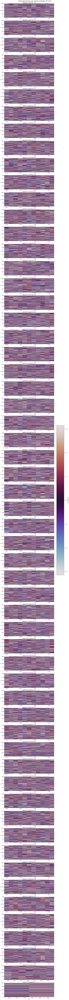

In [48]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np

# STFTパラメータ
sr = hps.data.sampling_rate
n_fft = hps.data.filter_length
hop_length = hps.data.hop_length
win_length = hps.data.filter_length

num_segments = len(decoded_segments)

print(f"Total Segments: {num_segments}")
print("Generating Phase Spectrograms for each segment...")

# 図の準備 (セグメント数ぶんだけ縦に並べる)
# 高さ(figsize)を動的に調整
fig, axes = plt.subplots(num_segments, 1, figsize=(12, 3 * num_segments), constrained_layout=True)

# セグメントが1つしかない場合の処理（axesがリストにならないため）
if num_segments == 1:
    axes = [axes]

for i, seg in enumerate(decoded_segments):
    y = seg["audio"]
    ax = axes[i]
    
    # 1. STFT計算
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    
    # 2. 位相抽出 (-π ~ π)
    phase = np.angle(D)
    
    # 3. プロット
    # cmap='twilight' は位相のような周期的データ(πと-πがつながる)に最適な色使いです
    img = librosa.display.specshow(phase, sr=sr, hop_length=hop_length, 
                                   n_fft=n_fft, win_length=win_length,
                                   x_axis='time', y_axis='linear', 
                                   cmap='twilight', ax=ax)
    
    ax.set_title(f'Segment {i+1} (Latent len: {seg["z_len"]})')
    ax.set_ylabel('Hz')
    if i < num_segments - 1:
        ax.set_xlabel('') # 最後のグラフ以外はXラベルを省く

# カラーバーを一つ追加
fig.colorbar(img, ax=axes, format="%+2.0f rad", label='Phase (radians)')
plt.suptitle(f"Phase Spectrogram per Segment (Speaker ID: {speaker_id})", fontsize=16)
plt.show()

Total Segments: 53
Generating Unwrapped Phase Spectrograms...


/Users/naru/.conda/envs/ms-istft2/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=512
  return f(*args, **kwargs)


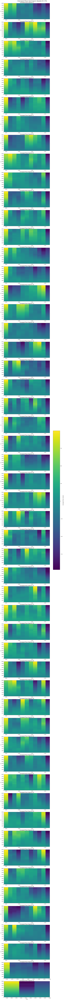

In [61]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np

# 設定
sr = hps.data.sampling_rate
n_fft = hps.data.filter_length
hop_length = hps.data.hop_length
win_length = hps.data.filter_length

num_segments = len(decoded_segments)

print(f"Total Segments: {num_segments}")
print("Generating Unwrapped Phase Spectrograms...")

fig, axes = plt.subplots(num_segments, 1, figsize=(12, 3.5 * num_segments), constrained_layout=True)

if num_segments == 1:
    axes = [axes]

for i, seg in enumerate(decoded_segments):
    y = seg["audio"]
    ax = axes[i]
    
    # 1. STFT
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    
    # 2. 位相抽出 & アンラップ
    # axis=0 (周波数方向) にアンラップするのが一般的です
    raw_phase = np.angle(D)
    unwrapped_phase = np.unwrap(raw_phase, axis=0)
    
    # 3. プロット
    # アンラップ位相は -π~π に収まらないため、'twilight'ではなく
    # 大小関係がわかる 'viridis' や 'magma' などのシーケンシャルな色を使います
    img = librosa.display.specshow(unwrapped_phase, sr=sr, hop_length=hop_length, 
                                   n_fft=n_fft, win_length=win_length,
                                   x_axis='time', y_axis='linear', 
                                   cmap='viridis', ax=ax)
    
    ax.set_title(f'Unwrapped Phase (Segment {i+1})')
    ax.set_ylabel('Hz')
    if i < num_segments - 1:
        ax.set_xlabel('')

# カラーバー（値の範囲が広いため、目盛りは自動調整）
fig.colorbar(img, ax=axes, label='Unwrapped Phase (radians)')
plt.suptitle(f"Unwrapped Phase Spectrogram (Speaker ID: {speaker_id})", fontsize=16)
plt.show()

Checking phase consistency at overlap regions...


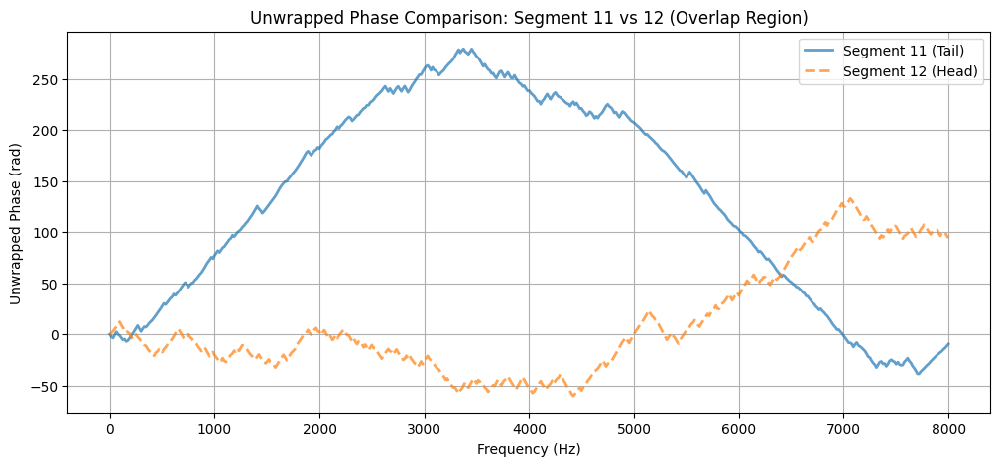

グラフの線が重なっているほど、位相が連続しており、滑らかに結合できます。
線が大きくズレている場合、結合時に干渉（シュワシュワ音）が発生します。


In [63]:
# --- つなぎ目の位相整合性チェック ---
print("Checking phase consistency at overlap regions...")

# 比較するセグメントのペア（例：Seg1とSeg2）
# 好きなペアインデックスに変えてください
seg_idx_A = 10
seg_idx_B = 11

if len(decoded_segments) > 1:
    # 1. データ取得
    # Seg A の最後のフレーム付近
    y_a = decoded_segments[seg_idx_A]["audio"]
    D_a = librosa.stft(y_a, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    # オーバーラップしていたはずのフレーム（末尾から数フレーム戻った位置）を取得
    # ※chunk_sizeなどから概算。ここでは末尾から2フレーム目を採用
    frame_a = D_a[:, -2] 
    
    # Seg B の最初のフレーム付近
    y_b = decoded_segments[seg_idx_B]["audio"]
    D_b = librosa.stft(y_b, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    # 先頭から2フレーム目を採用
    frame_b = D_b[:, 1]
    
    # 2. アンラップ位相の計算 (1次元)
    phase_a_unwrapped = np.unwrap(np.angle(frame_a))
    phase_b_unwrapped = np.unwrap(np.angle(frame_b))
    
    # 3. 比較プロット
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    plt.figure(figsize=(12, 5))
    plt.plot(freqs, phase_a_unwrapped, label=f'Segment {seg_idx_A+1} (Tail)', alpha=0.7, linewidth=2)
    plt.plot(freqs, phase_b_unwrapped, label=f'Segment {seg_idx_B+1} (Head)', alpha=0.7, linestyle='--', linewidth=2)
    
    plt.title(f'Unwrapped Phase Comparison: Segment {seg_idx_A+1} vs {seg_idx_B+1} (Overlap Region)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Unwrapped Phase (rad)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("グラフの線が重なっているほど、位相が連続しており、滑らかに結合できます。")
    print("線が大きくズレている場合、結合時に干渉（シュワシュワ音）が発生します。")
else:
    print("セグメントが1つしかないため、比較できません。")

In [64]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
import librosa
import librosa.display
try:
    from google.colab import files
except ImportError:
    pass

# ▼▼▼ 保存するファイル名 ▼▼▼
output_pdf_name = f"phase_analysis_sid{speaker_id}.pdf"
# ▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

# STFTパラメータ
sr = hps.data.sampling_rate
n_fft = hps.data.filter_length
hop_length = hps.data.hop_length
win_length = hps.data.filter_length
freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

print(f"Creating PDF: {output_pdf_name} ...")

with PdfPages(output_pdf_name) as pdf:
    
    # ==========================================
    # 1ページ目: 全セグメントのアンラップ位相スペクトログラム一覧
    # ==========================================
    print("  - Page 1: Unwrapped Phase Spectrograms")
    num_segments = len(decoded_segments)
    
    # セグメント数に応じて図の高さを自動調整
    fig_h = max(5, 3 * num_segments) 
    fig, axes = plt.subplots(num_segments, 1, figsize=(12, fig_h), constrained_layout=True)
    
    if num_segments == 1:
        axes = [axes]

    for i, seg in enumerate(decoded_segments):
        y = seg["audio"]
        ax = axes[i]
        
        # STFT & Unwrap
        D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
        unwrapped_phase = np.unwrap(np.angle(D), axis=0) # 周波数方向にアンラップ
        
        img = librosa.display.specshow(unwrapped_phase, sr=sr, hop_length=hop_length, 
                                       n_fft=n_fft, win_length=win_length,
                                       x_axis='time', y_axis='linear', 
                                       cmap='viridis', ax=ax)
        
        ax.set_title(f'Segment {i+1} (Latent len: {seg["z_len"]})')
        ax.set_ylabel('Hz')
        if i < num_segments - 1:
            ax.set_xlabel('')

    plt.suptitle(f"Unwrapped Phase Spectrograms (Speaker ID: {speaker_id})", fontsize=16)
    
    # PDFにこのFigureを保存
    pdf.savefig(fig)
    plt.close() # メモリ解放

    # ==========================================
    # 2ページ目以降: セグメント間の接続部チェック (1対1比較)
    # ==========================================
    print("  - Subsequent Pages: Overlap Consistency Checks")
    
    for i in range(num_segments - 1):
        seg_A = decoded_segments[i]
        seg_B = decoded_segments[i+1]
        
        # データ取得: Seg A の尻尾 と Seg B の頭
        D_a = librosa.stft(seg_A["audio"], n_fft=n_fft, hop_length=hop_length, win_length=win_length)
        frame_a = D_a[:, -2] # 末尾付近

        D_b = librosa.stft(seg_B["audio"], n_fft=n_fft, hop_length=hop_length, win_length=win_length)
        frame_b = D_b[:, 1]  # 先頭付近
        
        # アンラップ
        ph_a = np.unwrap(np.angle(frame_a))
        ph_b = np.unwrap(np.angle(frame_b))
        
        # プロット作成
        fig = plt.figure(figsize=(10, 6))
        plt.plot(freqs, ph_a, label=f'Segment {i+1} (Tail)', alpha=0.7, linewidth=1.5)
        plt.plot(freqs, ph_b, label=f'Segment {i+2} (Head)', alpha=0.7, linestyle='--', linewidth=1.5)
        
        plt.title(f'Overlap Check: Segment {i+1} vs {i+2}')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Unwrapped Phase (rad)')
        plt.legend()
        plt.grid(True, alpha=0.5)
        
        # PDFに追加保存
        pdf.savefig(fig)
        plt.close()

print("✅ PDF generated successfully.")

# Google Colabならダウンロード
try:
    files.download(output_pdf_name)
except Exception:
    print(f"File saved locally as: {output_pdf_name}")

Creating PDF: phase_analysis_sid375.pdf ...
  - Page 1: Unwrapped Phase Spectrograms
  - Subsequent Pages: Overlap Consistency Checks
✅ PDF generated successfully.
File saved locally as: phase_analysis_sid375.pdf


In [65]:
import numpy as np
import torch
import librosa
import IPython.display as ipd

# ▼▼▼ 設定 ▼▼▼
# STFT設定 (モデルの設定と合わせる)
n_fft = hps.data.filter_length
hop_length = hps.data.hop_length
win_length = hps.data.filter_length

# オーバーラップの長さ（サンプル数）
# 前回のコードで計算した hop_length_samples を基準に、
# 実際に重なっている領域（およそ chunk_len - hop_len）を計算
# ここでは簡易的に「1フレーム分」を基準に位相合わせを行います
overlap_check_width = n_fft  # 位相計測に使う幅

print("Starting Phase-Corrected Stitching...")

# 1. 最初のセグメントはそのまま採用
corrected_audio_buffer = []
# 最初のセグメントの音声データ
current_audio = decoded_segments[0]["audio"]
corrected_audio_buffer.append(current_audio)

# 前のセグメントの「補正済み」音声の末尾を保存しておく
prev_tail_reference = current_audio[-overlap_check_width:]

# 2. 2つ目以降のセグメントを順次補正
for i in range(1, len(decoded_segments)):
    # 補正対象の生データ
    raw_audio = decoded_segments[i]["audio"]
    
    # A. 位相差を計測するための「のりしろ」部分を抽出
    # 前の尻尾（補正済み） vs 今の頭（未補正）
    # ※長さが足りない場合はパディング
    if len(raw_audio) < overlap_check_width:
        # 短すぎる場合は補正を諦めてそのまま使う
        corrected_audio = raw_audio
    else:
        target_head = raw_audio[:overlap_check_width]
        ref_tail = prev_tail_reference
        
        # 長さを揃える（短い方に合わせる）
        min_len = min(len(target_head), len(ref_tail))
        target_head = target_head[:min_len]
        ref_tail = ref_tail[:min_len]
        
        # 窓関数を掛けて端点の影響を減らす
        win = np.hanning(min_len)
        
        # B. FFTでスペクトルを取得
        # rfft (実数FFT) を使用
        fft_ref = np.fft.rfft(ref_tail * win)
        fft_target = np.fft.rfft(target_head * win)
        
        # C. 位相差ベクトル (Correction Vector) を計算
        # 「ターゲットをどれだけ回転させればリファレンスと重なるか」
        # exp(j * (Angle_Ref - Angle_Target))
        # ゼロ除算を防ぐため、絶対値が小さいところは計算しないなどの工夫もできますが、
        # ここでは単純に複素数の除算で回転量を求めます（正規化して振幅成分を捨てる）
        
        cross_product = fft_ref * np.conj(fft_target)
        # 振幅を1に正規化（純粋な回転量のみ抽出）
        correction_vector = cross_product / (np.abs(cross_product) + 1e-10)
        
        # D. セグメント全体に位相補正を適用
        # セグメント全体をSTFT
        stft_raw = librosa.stft(raw_audio, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
        
        # correction_vectorのサイズが n_fft//2 + 1 になるはず
        # stft_rawの周波数次元と一致するか確認
        if correction_vector.shape[0] == stft_raw.shape[0]:
            # ブロードキャスト乗算で、全時間の位相を一律にずらす
            stft_corrected = stft_raw * correction_vector[:, np.newaxis]
            
            # ISTFTで波形に戻す
            corrected_audio = librosa.istft(stft_corrected, hop_length=hop_length, win_length=win_length, length=len(raw_audio),dtype=np.float32)
        else:
            # サイズが合わない場合（FFTサイズ設定ミスなど）は補正なし
            print(f"Warning: FFT size mismatch at segment {i}. Skipping correction.")
            corrected_audio = raw_audio

    # E. 結果をリストに追加 & 次回のリファレンス更新
    corrected_audio_buffer.append(corrected_audio)
    prev_tail_reference = corrected_audio[-overlap_check_width:]


# --- 3. Overlap-Add (補正済みデータを使用) ---
print("Stitching corrected segments...")

# バッファなど準備（前回と同じロジック）
full_len = z.shape[2]
ref_audio_len = len(corrected_audio_buffer[0])
ref_z_len = decoded_segments[0]["z_len"]
upsample_ratio = ref_audio_len / ref_z_len

hop_length_samples = int(hop_size_frames * upsample_ratio)
estimated_total_samples = int((full_len + chunk_size_frames) * upsample_ratio)
output_buffer = np.zeros(estimated_total_samples, dtype=np.float32)

current_sample_pos = 0

for audio in corrected_audio_buffer:
    window = np.hanning(len(audio))
    windowed_audio = audio * window
    
    target_end = current_sample_pos + len(audio)
    if target_end > len(output_buffer):
        output_buffer = np.pad(output_buffer, (0, target_end - len(output_buffer)))
        
    output_buffer[current_sample_pos : target_end] += windowed_audio
    current_sample_pos += hop_length_samples

# トリミング
non_zero = np.where(np.abs(output_buffer) > 1e-5)[0]
if len(non_zero) > 0:
    final_audio = output_buffer[:non_zero[-1]+1]
else:
    final_audio = output_buffer

print(f"\n--- 🎧 Phase Corrected Audio (Speaker ID: {speaker_id}) ---")
ipd.display(ipd.Audio(final_audio, rate=hps.data.sampling_rate, normalize=False))

# --- 比較用：補正前 ---
# print("\n(Reference) Uncorrected Audio:")
# ipd.display(ipd.Audio(audio_combined, rate=hps.data.sampling_rate, normalize=False))

Starting Phase-Corrected Stitching...
Stitching corrected segments...

--- 🎧 Phase Corrected Audio (Speaker ID: 375) ---


Starting Time-Aligned Stitching (Cross-Correlation)...
Processed segment 5: Best match offset found at sample 147
Processed segment 10: Best match offset found at sample 436
Processed segment 15: Best match offset found at sample 5
Processed segment 20: Best match offset found at sample 654
Processed segment 25: Best match offset found at sample 131
Processed segment 30: Best match offset found at sample 794
Processed segment 35: Best match offset found at sample 156
Processed segment 40: Best match offset found at sample 680
Processed segment 45: Best match offset found at sample 784
Processed segment 50: Best match offset found at sample 746

--- 🎧 Time-Aligned Audio (Speaker ID: 375) ---


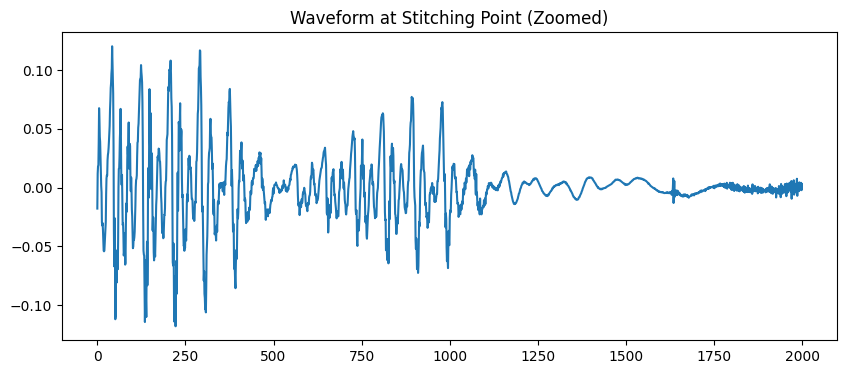

In [66]:
import numpy as np
import torch
import librosa
import IPython.display as ipd
from scipy import signal

# ▼▼▼ 設定 ▼▼▼
# 検索する範囲（サンプル数）
# VITSのゆらぎ吸収用。大きすぎると誤判定するので 20ms程度(約500サンプル)が目安
search_range = 500  

# クロスフェードする幅（サンプル数）
# 重なり全体を混ぜるのではなく、アライメント後の「安全な範囲」だけで混ぜます
# 短め（例: 256~512）にすると二重聞こえが減り、長めにすると滑らかになります
cross_fade_len = 512 

print("Starting Time-Aligned Stitching (Cross-Correlation)...")

# 1. 最初のセグメントをバッファに入れる
# listではなく、随時結合していく方式をとります
combined_audio = decoded_segments[0]["audio"]

# 2. 2つ目以降のセグメントを順次結合
for i in range(1, len(decoded_segments)):
    new_audio = decoded_segments[i]["audio"]
    
    # --- A. アライメント位置の検索 ---
    # 前の音声の「末尾」と、新しい音声の「先頭」を取り出す
    # 検索範囲 + クロスフェード分くらいの余裕を持つ
    check_len = cross_fade_len + search_range * 2
    
    # 前の音声の末尾 (Reference)
    # 十分な長さがない場合はあるだけ使う
    ref_len = min(len(combined_audio), check_len)
    ref_audio = combined_audio[-ref_len:]
    
    # 新しい音声の先頭 (Target)
    target_len = min(len(new_audio), check_len)
    target_audio = new_audio[:target_len]
    
    # 相互相関 (Cross-Correlation) を計算
    # これにより「どれくらいずらしたら波形がマッチするか」がわかる
    corr = signal.correlate(ref_audio, target_audio, mode='valid', method='fft')
    
    # ピークの位置を探す
    peak_idx = np.argmax(corr)
    
    # 「どれくらいずれているか」を計算
    # mode='valid' の場合、基準点からのオフセットになる
    # (ref_len - target_len) などの補正が必要だが、
    # シンプルに「refの末尾」と「targetの先頭」の重なり具合を計算
    
    # 簡易実装: 最も相関が高かった位置で重ね合わせる
    # ref_audio の中で、target_audio が最もマッチした開始位置
    # (signal.correlateの仕様に基づき逆算)
    
    # 今回はより直感的な「スライド探索」で実装し直します（下記参照）
    # ---------------------------------------------------------
    
    best_offset = 0
    max_corr = -np.inf
    
    # 期待されるオーバーラップ中心位置
    # (前のコードのhop_size計算に基づく予測位置)
    # しかしVITSは長さが変わるので、ここは「末尾付近」を基準に総当たりするほうが確実です
    
    # 前の尻尾(固定)
    ref_window = combined_audio[-cross_fade_len:] 
    
    # 新しい頭(探索)
    # ref_windowと同じ長さの窓を、new_audioからスライドして切り出し、相関を見る
    # 検索範囲: new_audioの [0] から [search_range] くらいまで
    
    search_start = 0
    search_end = min(len(new_audio) - cross_fade_len, search_range * 2)
    
    if search_end <= search_start:
        # 音声が短すぎる場合はそのままつなぐ
        best_idx = 0
    else:
        # スライド探索
        # target_pool: 検索対象となるnew_audioの領域
        target_pool = new_audio[search_start : search_end + cross_fade_len]
        
        # 相関計算
        # ref_window (固定) と target_pool (広い) の相関
        c = signal.correlate(target_pool, ref_window, mode='valid')
        best_idx = np.argmax(c) # ここが「最も似ている部分の開始位置」
    
    # --- B. 結合 (Stitching) ---
    
    # 1. 結合点までの古い音声 (フェードアウト前まで)
    # combined_audio のうち、クロスフェードに使う部分を残してそこまでを採用...
    # ではなく、Overlapped-Addなので「重なる部分」を作ります
    
    # 結合点（前の音声の終了位置 - クロスフェード長）
    split_point = len(combined_audio) - cross_fade_len
    
    # 前半部（クロスフェードしない確定部分）
    part_prev_safe = combined_audio[:split_point]
    
    # 前半のクロスフェード部
    part_prev_fade = combined_audio[split_point:]
    
    # 後半のクロスフェード部
    # best_idx が「ref_windowと最も一致した場所」なので、そこを重ねる
    part_new_fade = new_audio[best_idx : best_idx + cross_fade_len]
    
    # 後半部（残りの部分）
    part_new_safe = new_audio[best_idx + cross_fade_len:]
    
    # --- C. クロスフェード処理 ---
    
    # 長さチェック（念のため）
    fade_len = min(len(part_prev_fade), len(part_new_fade))
    
    if fade_len > 0:
        # 窓関数作成
        fade_in = np.linspace(0, 1, fade_len)
        fade_out = 1.0 - fade_in
        
        # 混ぜる
        faded_part = (part_prev_fade[:fade_len] * fade_out) + (part_new_fade[:fade_len] * fade_in)
        
        # 結合: [確定した過去] + [混ぜた部分] + [新しい未来]
        combined_audio = np.concatenate([part_prev_safe, faded_part, part_new_safe])
    else:
        # エラー回避: そのまま連結
        combined_audio = np.concatenate([combined_audio, new_audio])

    if i % 5 == 0:
        print(f"Processed segment {i}: Best match offset found at sample {best_idx}")


print("\n--- 🎧 Time-Aligned Audio (Speaker ID: {}) ---".format(speaker_id))
ipd.display(ipd.Audio(combined_audio, rate=hps.data.sampling_rate, normalize=False))

# 波形比較（最初の結合部）
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4))
plt.plot(combined_audio[len(decoded_segments[0]["audio"])-1000 : len(decoded_segments[0]["audio"])+1000])
plt.title("Waveform at Stitching Point (Zoomed)")
plt.show()

In [77]:
import numpy as np
import torch
import IPython.display as ipd

# ▼▼▼ 設定 (単位はすべて「フレーム数」になります) ▼▼▼
# MS-iSTFT-VITSの hop_size が 256 の場合、1フレーム ≈ 11ms です
# 波形での 512サンプル ≈ 2フレーム

search_range_frames = 4   # 探索範囲 (前後4フレーム程度を見る)
cross_fade_frames = 2     # クロスフェード幅 (2~4フレーム程度で十分)

print("Starting Spectrogram Stitching (Frequency Domain)...")

def to_complex(spec, phase):
    """振幅と位相を複素数スペクトログラムに変換"""
    # spec, phase shape: [Channels, Frames] (Batch次元は除去済みと仮定)
    return spec * torch.exp(1j * phase)

def from_complex(complex_spec):
    """複素数スペクトログラムを振幅と位相に戻す"""
    return torch.abs(complex_spec), torch.angle(complex_spec)

# 1. 最初のセグメントを取り出し、複素数平面に変換してバッファへ
# Tensor操作を想定 (CPU/GPUに合わせて device=... は適宜調整してください)
current_spec = decoded_segments[0]["spec"].squeeze()   # [Channels, Frames]
current_phase = decoded_segments[0]["phase"].squeeze() # [Channels, Frames]

# 複素数として保持（計算用）
combined_complex = to_complex(current_spec, current_phase)

# 2. 2つ目以降を順次結合
for i in range(1, len(decoded_segments)):
    new_spec = decoded_segments[i]["spec"].squeeze()
    new_phase = decoded_segments[i]["phase"].squeeze()
    new_complex = to_complex(new_spec, new_phase)
    
    # --- A. アライメント位置の検索 (振幅スペクトルで行う) ---
    
    # 前の尻尾 (Reference)
    # [Channels, Frames] なので、時間軸は dim=1
    ref_len = min(combined_complex.shape[1], cross_fade_frames + search_range_frames * 2)
    
    # 比較用に振幅だけ取り出す
    ref_mag = torch.abs(combined_complex[:, -ref_len:]) 
    
    # 新しい頭 (Target)
    target_len = min(new_complex.shape[1], cross_fade_frames + search_range_frames * 2)
    target_mag = new_spec[:, :target_len] # new_specは既に振幅
    
    # マッチング探索
    # スペクトログラムは多次元なので、signal.correlate よりも
    # フレームごとの「距離（誤差）」を最小化する方が簡単で確実です
    
    best_offset = 0
    min_error = float('inf')
    
    # 探索範囲の決定 (new_audio側をスライドさせるイメージ)
    # refの「末尾」と newの「先頭」を cross_fade_frames 分だけ重ねる前提で、
    # どこが一番滑らかに繋がるかを探す
    
    # 基準となる ref の末尾領域（クロスフェード対象エリア）
    ref_window = ref_mag[:, -cross_fade_frames:]
    
    # 探索: new_spec の先頭付近から ref_window と同じサイズの窓を切り出して比較
    search_limit = min(target_mag.shape[1] - cross_fade_frames, search_range_frames * 2)
    
    if search_limit <= 0:
        best_idx = 0
    else:
        # スライド探索
        errors = []
        for shift in range(search_limit):
            # 比較対象の窓
            target_window = target_mag[:, shift : shift + cross_fade_frames]
            
            # L1誤差 (絶対値誤差の総和) を計算。L2でもOK
            # フレーム全体のパターンが似ているかを見る
            diff = torch.sum(torch.abs(ref_window - target_window))
            
            if diff < min_error:
                min_error = diff
                best_idx = shift

    # --- B. 結合 (Stitching with Complex Cross-Fade) ---
    
    # 結合点（前のスペクトログラムの終了位置 - クロスフェード長）
    split_point = combined_complex.shape[1] - cross_fade_frames
    
    # 1. 確定した過去部分
    part_prev_safe = combined_complex[:, :split_point]
    
    # 2. クロスフェードする部分 (前)
    part_prev_fade = combined_complex[:, split_point:]
    
    # 3. クロスフェードする部分 (後)
    # best_idx から cross_fade_frames 分だけ取得
    part_new_fade = new_complex[:, best_idx : best_idx + cross_fade_frames]
    
    # 4. 新しい未来部分
    part_new_safe = new_complex[:, best_idx + cross_fade_frames:]
    
    # --- C. クロスフェード処理 (複素数で行う) ---
    fade_len = part_prev_fade.shape[1] # 実際のフェード長
    
    if fade_len > 0:
        # 窓関数 (Tensor)
        alpha = torch.linspace(0, 1, fade_len).to(part_prev_fade.device)
        # Broadcasting用に次元を合わせる [Channels, FadeLen]
        alpha = alpha.unsqueeze(0) 
        
        # 複素数空間での線形補間
        # (位相が大きく回っている場合でも、ベクトル和として滑らかに繋がります)
        faded_part = (part_prev_fade * (1.0 - alpha)) + (part_new_fade * alpha)
        
        # 結合
        combined_complex = torch.cat([part_prev_safe, faded_part, part_new_safe], dim=1)
    else:
        combined_complex = torch.cat([combined_complex, new_complex], dim=1)

    if i % 5 == 0:
        print(f"Processed segment {i}: Best match offset found at frame {best_idx}")

# --- 最終処理: iSTFTへ渡す形に戻す ---
final_spec, final_phase = from_complex(combined_complex)

# バッチ次元を復元 [1, Channels, Frames]
final_spec = final_spec.unsqueeze(0)
final_phase = final_phase.unsqueeze(0)

print(f"Final Spectrogram Shape: {final_spec.shape}")

# ▼ ここで iSTFT を実行します ▼
# MS-iSTFT-VITSのGenerator等が持っているiSTFT関数を呼び出す想定
# waveform = net_g.istft(final_spec, final_phase) 
# または
# waveform = torch.istft(...) # ※設定による

Starting Spectrogram Stitching (Frequency Domain)...


KeyError: 'spec'

In [ ]:
# 推論実行
with torch.no_grad():
    # inferの戻り値が増えたので受け取る
    audio, _, spec, phase, *_ = net_g.infer(...)

    # MS-iSTFTの場合、specのshapeは [1, Subbands, Freq, Time] です
    # 結合処理をしやすくするため、SubbandとFreqをまとめて「Channels」扱いにして平坦化します
    # [1, 4, 257, Time] -> [4*257, Time]
    
    B, S, F, T = spec.shape
    spec_reshaped = spec.view(S * F, T).cpu()
    phase_reshaped = phase.view(S * F, T).cpu()
    
    decoded_segments.append({
        "audio": audio.data.cpu().numpy(),
        "spec": spec_reshaped,  # これなら結合コードがそのまま動きます
        "phase": phase_reshaped,
        "original_shape": (S, F) # 後で戻すために保存
    })

In [78]:
print(decoded_segments[0].keys())
# 出力例: dict_keys(['audio', 'z']) などになっていませんか？

dict_keys(['audio', 'z_len'])


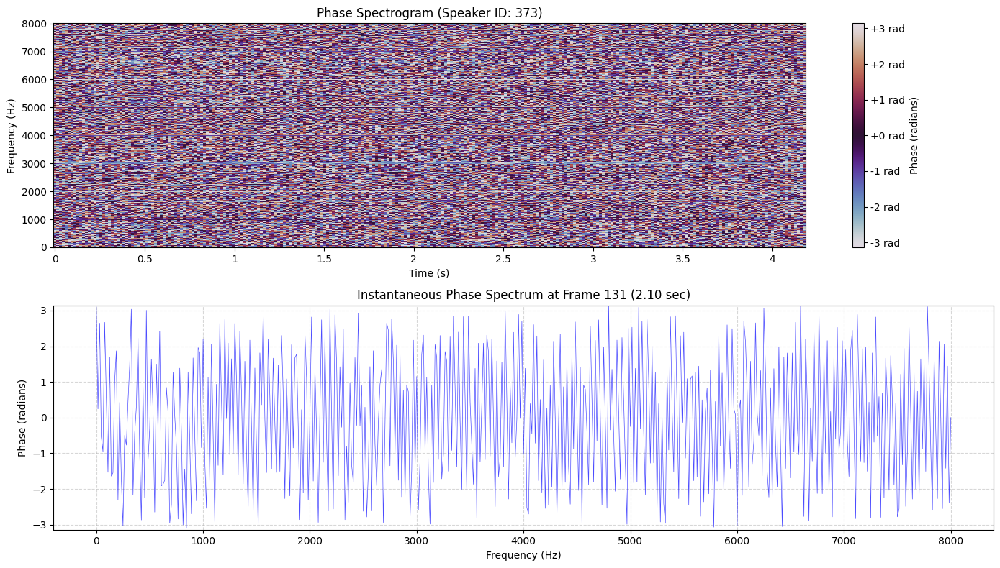

In [38]:
import matplotlib.pyplot as plt
import librosa
import librosa.display

# 生成された音声データとサンプリングレート
y = audio_combined
sr = hps.data.sampling_rate

# STFTの設定 (VITSのconfigに合わせるのが一般的です)
n_fft = hps.data.filter_length
hop_length = hps.data.hop_length
win_length = hps.data.filter_length # または config内の win_length

# 1. STFT計算
# 複素数スペクトルを取得
D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)

# 2. 位相（偏角）の抽出
# np.angle は -π から +π の範囲を返します
phase = np.angle(D)

# --- プロット ---
plt.figure(figsize=(14, 8))

# A. 位相スペクトログラム (Phase Spectrogram)
# 時間-周波数平面での位相の分布。色は -π ~ π を表します。
plt.subplot(2, 1, 1)
# cmap='twilight' や 'hsv' は位相のような周期的データに適しています
librosa.display.specshow(phase, sr=sr, hop_length=hop_length, x_axis='time', y_axis='linear', cmap='twilight')
plt.colorbar(format="%+2.0f rad", label='Phase (radians)')
plt.title(f'Phase Spectrogram (Speaker ID: {speaker_id})')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')

# B. 特定フレームの位相スペクトル (Instantaneous Phase Spectrum)
# 音声のちょうど真ん中あたりのフレームを切り出して表示します
target_frame = phase.shape[1] // 2
phase_slice = phase[:, target_frame]
freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

plt.subplot(2, 1, 2)
plt.plot(freqs, phase_slice, alpha=0.7, color='blue', linewidth=0.5)
plt.title(f'Instantaneous Phase Spectrum at Frame {target_frame} ({target_frame * hop_length / sr:.2f} sec)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (radians)')
plt.ylim(-np.pi, np.pi)
plt.grid(True, which='both', linestyle='--', alpha=0.5)

# 見やすくするためにレイアウト調整
plt.tight_layout()
plt.show()

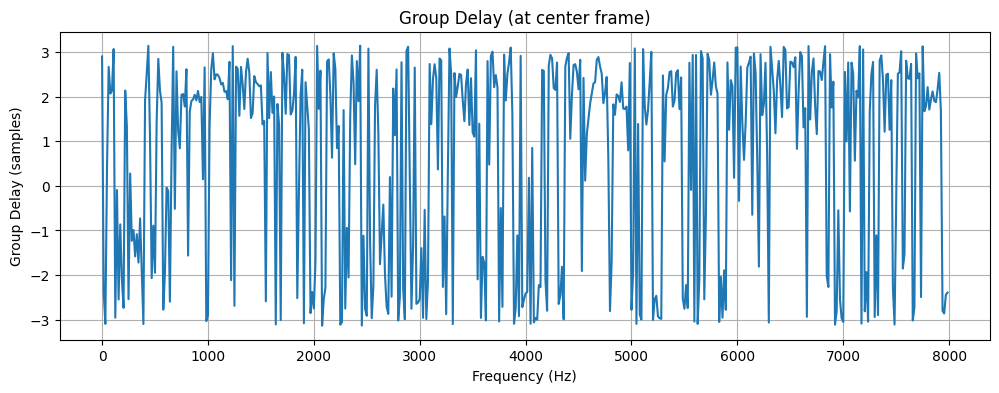

In [39]:
# 群遅延の計算 (位相を周波数方向に微分してマイナスをかける)
# unwrapしてから微分します
unwrapped_phase = np.unwrap(phase_slice)
group_delay = -np.diff(unwrapped_phase)
gd_freqs = freqs[:-1] # 微分で要素が1つ減るため

plt.figure(figsize=(12, 4))
plt.plot(gd_freqs, group_delay)
plt.title('Group Delay (at center frame)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Group Delay (samples)')
plt.grid(True)
plt.show()

In [29]:
# ▼▼▼ 診断用コード ▼▼▼
print("--- Model Diagnostics ---")

# 1. Config上の話者数を確認
if hasattr(hps.data, 'n_speakers'):
    print(f"hps.data.n_speakers: {hps.data.n_speakers}")
else:
    print("hps.data.n_speakers: Not found in config")

# 2. モデル構造の中に 'emb_g' があるか全探索
found_emb_g = False
if hasattr(net_g, 'module'):
    model_ref = net_g.module
    print("Model is wrapped in DataParallel/DistributedDataParallel")
else:
    model_ref = net_g
    print("Model is standard (not wrapped)")

# 属性リストを表示して emb_g っぽいものがないか探す
print(f"\nChecking attributes of {type(model_ref).__name__}:")
keys = list(model_ref.__dict__['_modules'].keys())
print(f"Layers found: {keys}")

if 'emb_g' in keys:
    print("✅ 'emb_g' exists! (Why was it not found before?)")
else:
    print("❌ 'emb_g' does NOT exist.")

# 3. 強制チェック
try:
    test_sid = torch.LongTensor([0]).to(device)
    test_g = model_ref.emb_g(test_sid)
    print("\nTest: model.emb_g(0) executed successfully.")
except Exception as e:
    print(f"\nTest: model.emb_g(0) failed. Error: {e}")

--- Model Diagnostics ---
hps.data.n_speakers: 380
Model is standard (not wrapped)

Checking attributes of SynthesizerTrn:
Layers found: ['enc_p', 'dec', 'enc_q', 'flow', 'dp', 'emb_g']
✅ 'emb_g' exists! (Why was it not found before?)

Test: model.emb_g(0) executed successfully.



--- 📈 500Hz付近の位相時間変化 ---
Target: ~500Hz -> Selected Peak Frequency: 453.12 Hz (Bin: 29)


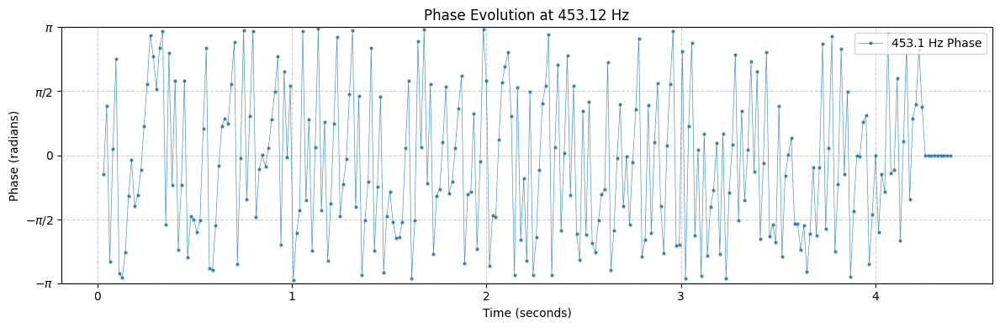

In [68]:
import matplotlib.pyplot as plt
import librosa
import numpy as np

def plot_phase_time_series(audio_data, sr, target_freq=500, search_width_hz=100):
    """
    指定した周波数付近で最も振幅が大きい成分の位相を時間変化としてプロットします。
    横軸: 時刻 (sec)
    縦軸: 位相角 (rad)
    """
    # 1. STFT計算
    n_fft = 1024
    hop_length = 256
    D = librosa.stft(audio_data, n_fft=n_fft, hop_length=hop_length)
    
    # 複素数から振幅と位相を分離
    magnitude = np.abs(D)
    phase = np.angle(D)
    
    # 2. 周波数軸の取得
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 3. ターゲット周波数(500Hz)周辺のインデックス範囲を特定
    # search_width_hz の範囲(例: 400Hz~600Hz)でピークを探す
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width_hz)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width_hz)))
    
    # この範囲内で、平均振幅が最大の周波数ビンを探す
    # (ノイズではなく、主要な成分の位相を見るため)
    target_band_magnitude = np.mean(magnitude[idx_start:idx_end, :], axis=1)
    peak_local_idx = np.argmax(target_band_magnitude)
    best_bin_idx = idx_start + peak_local_idx
    best_freq = freqs[best_bin_idx]
    
    print(f"Target: ~{target_freq}Hz -> Selected Peak Frequency: {best_freq:.2f} Hz (Bin: {best_bin_idx})")

    # 4. 選んだ周波数の位相データを抽出
    phase_track = phase[best_bin_idx, :]
    times = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=hop_length, n_fft=n_fft)

    # 5. プロット
    plt.figure(figsize=(12, 4))
    
    # メインの位相プロット
    plt.plot(times, phase_track, label=f'{best_freq:.1f} Hz Phase', marker='o', markersize=2, linewidth=0.5, alpha=0.8)
    
    plt.title(f"Phase Evolution at {best_freq:.2f} Hz")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Phase (radians)")
    plt.ylim(-np.pi, np.pi) # 縦軸を -π ～ +π に固定
    
    # 目盛りにπを表示して見やすくする
    plt.yticks(
        [-np.pi, -np.pi/2, 0, np.pi/2, np.pi],
        [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$']
    )
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(loc='upper right')
    plt.tight_layout()
    pdf_filename_2 = f'Phase Evolution at {best_freq:.2f} Hz.pdf'
    plt.savefig(pdf_filename_2, format='pdf', bbox_inches='tight')
    plt.show()

# --- 実行 ---
# 結合後の音声データ(output_buffer)に対してプロット
print("\n--- 📈 500Hz付近の位相時間変化 ---")
plot_phase_time_series(output_buffer, hps.data.sampling_rate, target_freq=500)


--- ⚔️ Phase Comparison (Fixed Frequency) ---
Locked Frequency for comparison: 500.00 Hz (Bin index: 32)


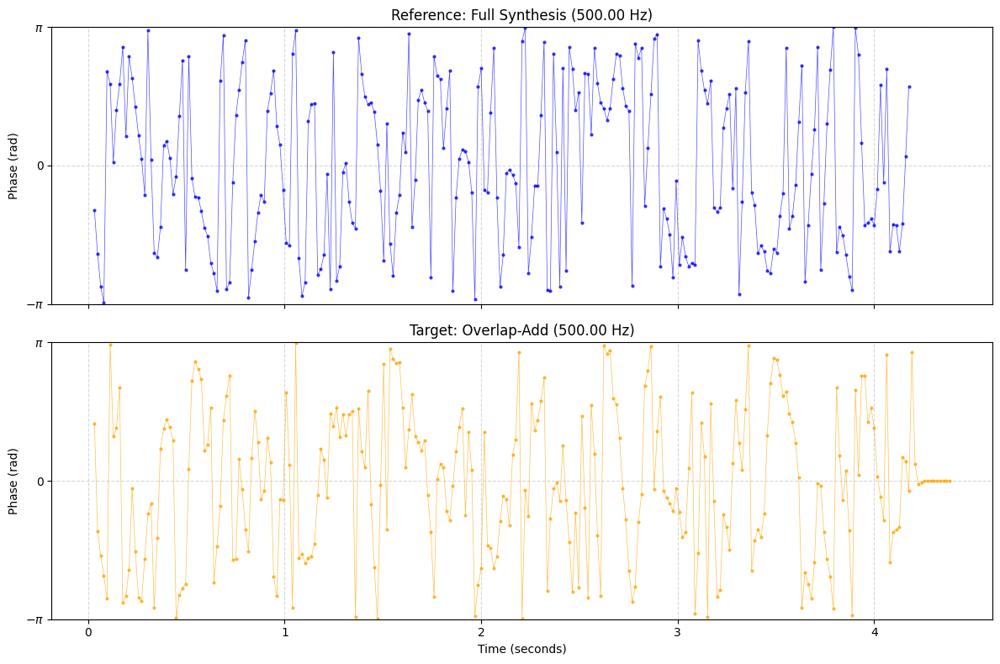

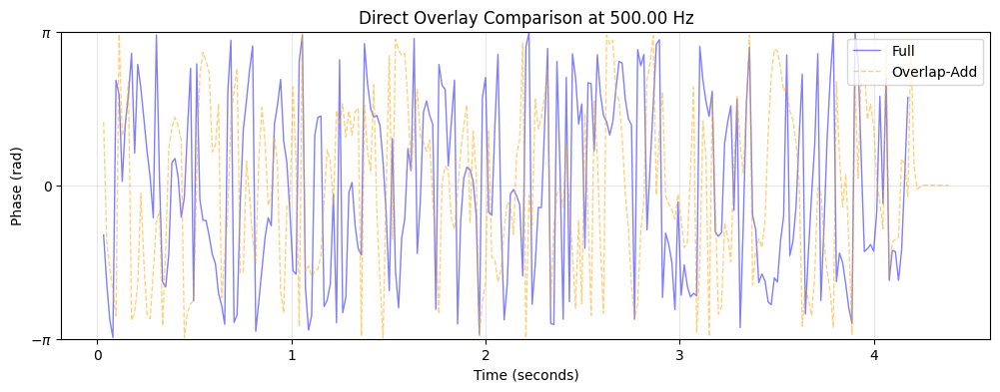

In [71]:
import matplotlib.pyplot as plt
import librosa
import numpy as np

def plot_phase_comparison(audio_ref, audio_tgt, sr, target_freq=500, search_width_hz=100):
    """
    基準音声(audio_ref)で500Hz付近のピーク周波数を特定し、
    その「同じ周波数ビン」における位相変化を audio_tgt と重ねて比較表示します。
    """
    n_fft = 1024
    hop_length = 256
    
    # --- 1. 基準音声 (Full Synthesis) の解析 ---
    D_ref = librosa.stft(audio_ref, n_fft=n_fft, hop_length=hop_length)
    mag_ref = np.abs(D_ref)
    phase_ref = np.angle(D_ref)
    
    # 周波数軸
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # ターゲット周波数周辺で、基準音声のエネルギーが最大のビンを探す
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width_hz)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width_hz)))
    
    # 平均振幅でピークを探す
    band_mag = np.mean(mag_ref[idx_start:idx_end, :], axis=1)
    peak_local = np.argmax(band_mag)
    target_bin_idx = idx_start + peak_local
    selected_freq = freqs[target_bin_idx]
    
    print(f"Locked Frequency for comparison: {selected_freq:.2f} Hz (Bin index: {target_bin_idx})")

    # --- 2. 比較対象音声 (Overlap-Add) の解析 ---
    # 同じビン (target_bin_idx) を使う
    D_tgt = librosa.stft(audio_tgt, n_fft=n_fft, hop_length=hop_length)
    phase_tgt = np.angle(D_tgt)
    
    # --- 3. 位相データの抽出 ---
    # 基準音声の位相
    phase_trace_ref = phase_ref[target_bin_idx, :]
    times_ref = librosa.frames_to_time(np.arange(len(phase_trace_ref)), sr=sr, hop_length=hop_length, n_fft=n_fft)
    
    # 比較音声の位相 (長さが違う可能性を考慮して別途抽出)
    phase_trace_tgt = phase_tgt[target_bin_idx, :]
    times_tgt = librosa.frames_to_time(np.arange(len(phase_trace_tgt)), sr=sr, hop_length=hop_length, n_fft=n_fft)

    # --- 4. プロット (上下に並べて比較) ---
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    
    # 上段: Full Synthesis (基準)
    ax1.plot(times_ref, phase_trace_ref, color='blue', marker='o', markersize=2, linewidth=0.5, alpha=0.7)
    ax1.set_title(f"Reference: Full Synthesis ({selected_freq:.2f} Hz)")
    ax1.set_ylabel("Phase (rad)")
    ax1.set_ylim(-np.pi, np.pi)
    ax1.set_yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
    ax1.grid(True, linestyle='--', alpha=0.5)

    # 下段: Overlap-Add (比較対象)
    ax2.plot(times_tgt, phase_trace_tgt, color='orange', marker='o', markersize=2, linewidth=0.5, alpha=0.7)
    ax2.set_title(f"Target: Overlap-Add ({selected_freq:.2f} Hz)")
    ax2.set_xlabel("Time (seconds)")
    ax2.set_ylabel("Phase (rad)")
    ax2.set_ylim(-np.pi, np.pi)
    ax2.set_yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
    ax2.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()
    
    # --- おまけ: 重ね合わせプロット (ズレを直接見る用) ---
    plt.figure(figsize=(12, 4))
    plt.plot(times_ref, phase_trace_ref, label='Full', color='blue', alpha=0.5, linewidth=1)
    plt.plot(times_tgt, phase_trace_tgt, label='Overlap-Add', color='orange', alpha=0.5, linewidth=1, linestyle='--')
    plt.title(f"Direct Overlay Comparison at {selected_freq:.2f} Hz")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Phase (rad)")
    plt.ylim(-np.pi, np.pi)
    plt.yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
    plt.legend(loc='upper right')
    plt.grid(True, alpha=0.3)
    plt.show()

# --- 実行 ---
# audio_full: Full Synthesisの結果 (numpy array)
# output_buffer: Overlap-Addの結果 (numpy array)
print("\n--- ⚔️ Phase Comparison (Fixed Frequency) ---")

# まだ変数がメモリにある前提で実行
if 'audio_full' in locals() and 'output_buffer' in locals():
    plot_phase_comparison(audio_full, output_buffer, hps.data.sampling_rate, target_freq=500)
else:
    print("エラー: audio_full または output_buffer が見つかりません。先に両方の生成コードを実行してください。")

Generating PDF: phase_comparison_500Hz.pdf ...
Locked Frequency: 500.00 Hz (Bin: 32)


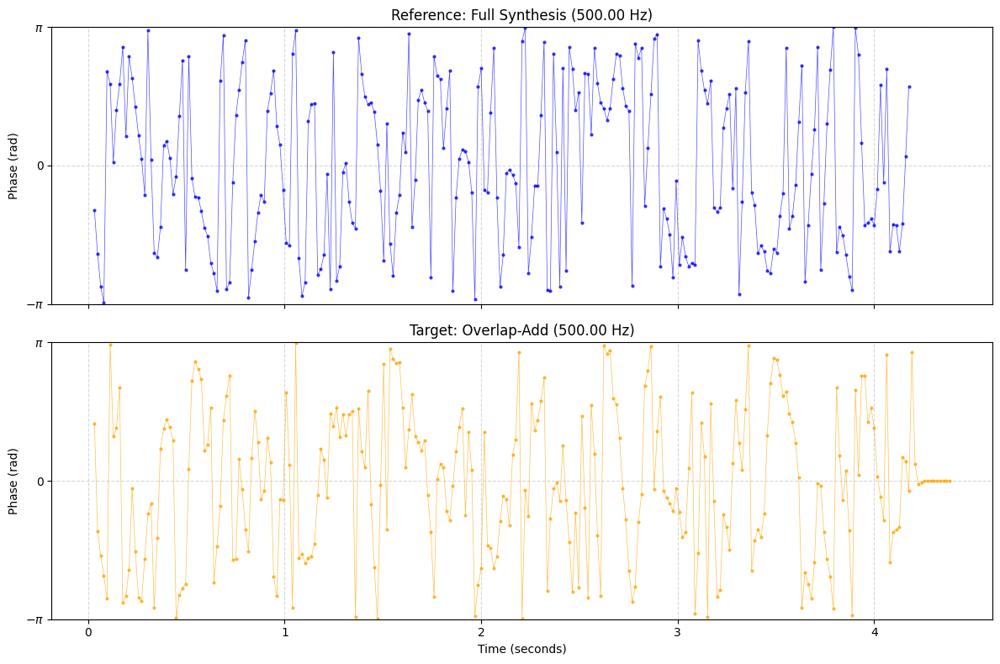

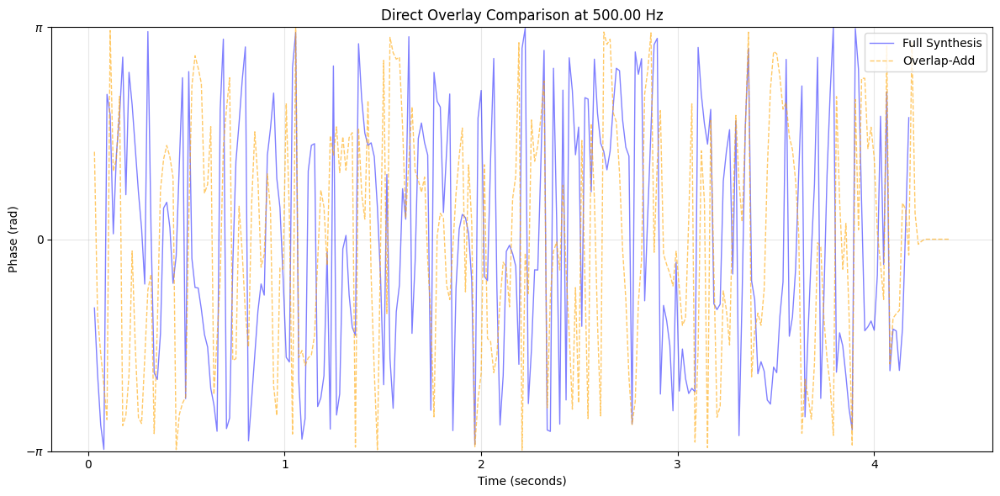

✅ PDF saved successfully: phase_comparison_500Hz.pdf


In [72]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages # PDF保存用ライブラリ
import librosa
import numpy as np
import datetime

def plot_phase_comparison_to_pdf(audio_ref, audio_tgt, sr, target_freq=500, search_width_hz=100, filename="phase_comparison.pdf"):
    """
    基準音声(audio_ref)とターゲット音声(audio_tgt)の位相比較を行い、
    結果をPDFファイルに保存して表示します。
    """
    print(f"Generating PDF: {filename} ...")
    
    n_fft = 1024
    hop_length = 256
    
    # --- 1. 解析 (前回と同じロジック) ---
    D_ref = librosa.stft(audio_ref, n_fft=n_fft, hop_length=hop_length)
    mag_ref = np.abs(D_ref)
    phase_ref = np.angle(D_ref)
    
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # ピーク探索
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width_hz)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width_hz)))
    band_mag = np.mean(mag_ref[idx_start:idx_end, :], axis=1)
    peak_local = np.argmax(band_mag)
    target_bin_idx = idx_start + peak_local
    selected_freq = freqs[target_bin_idx]
    
    print(f"Locked Frequency: {selected_freq:.2f} Hz (Bin: {target_bin_idx})")

    # 位相抽出
    D_tgt = librosa.stft(audio_tgt, n_fft=n_fft, hop_length=hop_length)
    phase_tgt = np.angle(D_tgt)
    
    phase_trace_ref = phase_ref[target_bin_idx, :]
    times_ref = librosa.frames_to_time(np.arange(len(phase_trace_ref)), sr=sr, hop_length=hop_length, n_fft=n_fft)
    
    phase_trace_tgt = phase_tgt[target_bin_idx, :]
    times_tgt = librosa.frames_to_time(np.arange(len(phase_trace_tgt)), sr=sr, hop_length=hop_length, n_fft=n_fft)

    # --- 2. PDF作成と描画 ---
    with PdfPages(filename) as pdf:
        
        # === ページ1: 上下比較プロット ===
        fig1, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
        
        # 上段: Reference
        ax1.plot(times_ref, phase_trace_ref, color='blue', marker='o', markersize=2, linewidth=0.5, alpha=0.7)
        ax1.set_title(f"Reference: Full Synthesis ({selected_freq:.2f} Hz)")
        ax1.set_ylabel("Phase (rad)")
        ax1.set_ylim(-np.pi, np.pi)
        ax1.set_yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
        ax1.grid(True, linestyle='--', alpha=0.5)

        # 下段: Target
        ax2.plot(times_tgt, phase_trace_tgt, color='orange', marker='o', markersize=2, linewidth=0.5, alpha=0.7)
        ax2.set_title(f"Target: Overlap-Add ({selected_freq:.2f} Hz)")
        ax2.set_xlabel("Time (seconds)")
        ax2.set_ylabel("Phase (rad)")
        ax2.set_ylim(-np.pi, np.pi)
        ax2.set_yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
        ax2.grid(True, linestyle='--', alpha=0.5)

        plt.tight_layout()
        
        # 保存と表示
        pdf.savefig(fig1) 
        plt.show()
        plt.close(fig1) # メモリ解放
        
        # === ページ2: 重ね合わせプロット ===
        fig2 = plt.figure(figsize=(12, 6))
        plt.plot(times_ref, phase_trace_ref, label='Full Synthesis', color='blue', alpha=0.5, linewidth=1)
        plt.plot(times_tgt, phase_trace_tgt, label='Overlap-Add', color='orange', alpha=0.6, linewidth=1, linestyle='--')
        
        plt.title(f"Direct Overlay Comparison at {selected_freq:.2f} Hz")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Phase (rad)")
        plt.ylim(-np.pi, np.pi)
        plt.yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
        plt.legend(loc='upper right')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        
        # 保存と表示
        pdf.savefig(fig2)
        plt.show()
        plt.close(fig2)
        
        # メタデータ設定 (任意)
        d = pdf.infodict()
        d['Title'] = 'Phase Comparison Analysis'
        d['Author'] = 'Naruhiko Shirai'
        d['CreationDate'] = datetime.datetime.today()

    print(f"✅ PDF saved successfully: {filename}")

# --- 実行 ---
# ファイル名を指定して実行
pdf_filename = "phase_comparison_500Hz.pdf"

if 'audio_full' in locals() and 'output_buffer' in locals():
    plot_phase_comparison_to_pdf(
        audio_full, 
        output_buffer, 
        hps.data.sampling_rate, 
        target_freq=500, 
        filename=pdf_filename
    )
    
    # Colab等でファイルをダウンロードする場合のヘルパー
    try:
        from google.colab import files
        files.download(pdf_filename)
    except ImportError:
        pass # ローカル環境なら何もしない
else:
    print("エラー: audio_full または output_buffer が見つかりません。")

Generating Segment Analysis PDF: segments_overlap_phase.pdf ...
Locked Frequency: 406.25 Hz (Bin: 26)


/Users/naru/.conda/envs/ms-istft2/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=512
  return f(*args, **kwargs)


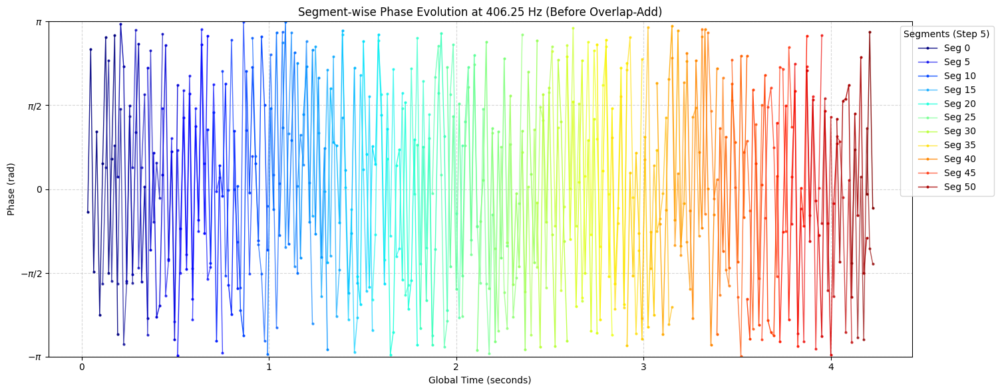

✅ PDF saved: segments_overlap_phase.pdf


In [73]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import librosa
import numpy as np

def plot_segments_phase_evolution(segments, sr, hop_size_frames, target_freq=500, filename="segments_phase_analysis.pdf"):
    """
    Overlap-Add前の各セグメントの位相を、正しい時間位置に配置してプロットします。
    """
    print(f"Generating Segment Analysis PDF: {filename} ...")
    
    # --- 共通パラメータ ---
    n_fft = 1024
    stft_hop = 256 # STFTの分析幅
    
    # --- 1. 時間換算係数の計算 ---
    # モデルのアップサンプリング率を計算 (音声長 / 潜在変数長)
    ref_audio_len = len(segments[0]["audio"])
    ref_z_len = segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    
    # 次のセグメントまでのずらし幅 (サンプル数)
    seg_hop_samples = int(hop_size_frames * upsample_ratio)
    
    # --- 2. ターゲット周波数の決定 (最初のセグメントを基準にする) ---
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 最初のセグメントを分析
    first_audio = segments[0]["audio"]
    D_first = librosa.stft(first_audio, n_fft=n_fft, hop_length=stft_hop)
    mag_first = np.abs(D_first)
    
    # 500Hz付近のピークを探す
    search_width = 100
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width)))
    
    # 時間方向の平均振幅が最大のビンを選ぶ
    band_mag = np.mean(mag_first[idx_start:idx_end, :], axis=1)
    peak_idx = np.argmax(band_mag)
    target_bin_idx = idx_start + peak_idx
    selected_freq = freqs[target_bin_idx]
    
    print(f"Locked Frequency: {selected_freq:.2f} Hz (Bin: {target_bin_idx})")

    # --- 3. 全セグメントの処理とプロット ---
    
    with PdfPages(filename) as pdf:
        plt.figure(figsize=(15, 6))
        
        current_sample_pos = 0
        colors = plt.cm.jet(np.linspace(0, 1, len(segments))) # 色を変化させる
        
        # 凡例が多すぎないようにするための工夫
        legend_interval = 5 

        for i, seg in enumerate(segments):
            audio = seg["audio"]
            
            # STFT
            D = librosa.stft(audio, n_fft=n_fft, hop_length=stft_hop)
            phase = np.angle(D)
            
            # 特定周波数の位相抽出
            phase_track = phase[target_bin_idx, :]
            
            # 時間軸の作成 (ローカル)
            times_local = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=stft_hop, n_fft=n_fft)
            
            # 時間軸をグローバル位置にシフト
            start_time_sec = current_sample_pos / sr
            times_global = times_local + start_time_sec
            
            # プロット (セグメントごとに色を変える)
            # 交互に透明度を変えて重なりを見やすくする
            alpha = 0.9 if i % 2 == 0 else 0.7
            label = f"Seg {i}" if i % legend_interval == 0 else None
            
            plt.plot(times_global, phase_track, color=colors[i], alpha=alpha, linewidth=1, marker='o', markersize=2, label=label)
            
            # 次のセグメントの開始位置へ更新
            current_sample_pos += seg_hop_samples

        plt.title(f"Segment-wise Phase Evolution at {selected_freq:.2f} Hz (Before Overlap-Add)")
        plt.xlabel("Global Time (seconds)")
        plt.ylabel("Phase (rad)")
        plt.ylim(-np.pi, np.pi)
        
        # Y軸のラベルを π 表記に
        plt.yticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
        
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1), title="Segments (Step 5)")
        plt.tight_layout()
        
        pdf.savefig()
        plt.show()
        plt.close()
        
        # --- (オプション) 拡大図: 最初の数セグメントだけ ---
        plt.figure(figsize=(15, 6))
        current_sample_pos = 0
        limit = min(6, len(segments)) # 最初の6つだけ
        
        for i in range(limit):
            seg = segments[i]
            audio = seg["audio"]
            phase_track = np.angle(librosa.stft(audio, n_fft=n_fft, hop_length=stft_hop))[target_bin_idx, :]
            
            times_global = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=stft_hop, n_fft=n_fft) + (current_sample_pos / sr)
            
            plt.plot(times_global, phase_track, marker='o', markersize=3, label=f"Seg {i}")
            current_sample_pos += seg_hop_samples

        plt.title(f"Zoomed: First {limit} Segments Overlap Analysis ({selected_freq:.2f} Hz)")
        plt.ylabel("Phase (rad)")
        plt.xlabel("Time (s)")
        plt.yticks([-np.pi, 0, np.pi], [r'$-\pi$', '0', r'$\pi$'])
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        pdf.savefig()
        plt.close()

    print(f"✅ PDF saved: {filename}")


# --- 実行 ---
# decoded_segments: 以前のコードで生成されたリスト
# hop_size_frames: 以前のコードで設定された変数 (例: 5)

if 'decoded_segments' in locals() and len(decoded_segments) > 0:
    plot_segments_phase_evolution(
        decoded_segments, 
        hps.data.sampling_rate, 
        hop_size_frames, 
        target_freq=500,
        filename="segments_overlap_phase.pdf"
    )
    
    # Colab用ダウンロード
    try:
        from google.colab import files
        files.download("segments_overlap_phase.pdf")
    except:
        pass
else:
    print("エラー: decoded_segments が見つかりません。")

In [74]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import librosa
import numpy as np

def plot_individual_segments_to_pdf(segments, sr, hop_size_frames, target_freq=500, filename="segments_individual_phase.pdf"):
    """
    1セグメントにつき1枚のグラフを作成し、PDFに保存します。
    横軸: グローバル時刻 (全体の中での位置)
    縦軸: 位相角 (-pi ~ +pi)
    """
    print(f"Generating Individual Segment PDF: {filename} ...")
    
    n_fft = 1024
    stft_hop = 256
    
    # --- 1. 時間管理の準備 ---
    if len(segments) == 0:
        print("Error: No segments found.")
        return

    # アップサンプリング率とホップ長の計算
    ref_audio_len = len(segments[0]["audio"])
    ref_z_len = segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    seg_hop_samples = int(hop_size_frames * upsample_ratio)
    
    # --- 2. 周波数のロック (最初のセグメントを基準にする) ---
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 最初のセグメントで500Hz付近のピークを探す
    first_audio = segments[0]["audio"]
    D_first = librosa.stft(first_audio, n_fft=n_fft, hop_length=stft_hop)
    mag_first = np.abs(D_first)
    
    search_width = 100
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width)))
    
    band_mag = np.mean(mag_first[idx_start:idx_end, :], axis=1)
    peak_idx = np.argmax(band_mag)
    target_bin_idx = idx_start + peak_idx
    selected_freq = freqs[target_bin_idx]
    
    print(f"Locked Frequency: {selected_freq:.2f} Hz (Bin: {target_bin_idx})")

    # --- 3. ページごとにプロット作成 ---
    current_sample_pos = 0
    
    with PdfPages(filename) as pdf:
        for i, seg in enumerate(segments):
            audio = seg["audio"]
            
            # --- 解析 ---
            D = librosa.stft(audio, n_fft=n_fft, hop_length=stft_hop)
            phase = np.angle(D)
            phase_track = phase[target_bin_idx, :]
            
            # --- 時間軸 (グローバル時刻に変換) ---
            # セグメント内の相対時間
            times_local = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=stft_hop, n_fft=n_fft)
            # 全体の中での絶対時間
            start_time_sec = current_sample_pos / sr
            times_global = times_local + start_time_sec
            
            # --- プロット ---
            plt.figure(figsize=(10, 5)) # 1ページあたりのサイズ
            
            plt.plot(times_global, phase_track, marker='o', markersize=4, linewidth=1, color='blue')
            
            # 装飾
            plt.title(f"Segment {i} : Phase at {selected_freq:.2f} Hz\n(Global Time: {times_global[0]:.3f}s - {times_global[-1]:.3f}s)")
            plt.xlabel("Global Time (seconds)")
            plt.ylabel("Phase (radians)")
            plt.ylim(-np.pi, np.pi)
            
            # π表記
            plt.yticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], 
                       [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
            
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            
            # PDFに保存して閉じる
            pdf.savefig()
            plt.close()
            
            # 次のセグメントの開始位置へ更新
            current_sample_pos += seg_hop_samples

    print(f"✅ PDF saved: {filename}")

# --- 実行 ---
if 'decoded_segments' in locals() and len(decoded_segments) > 0:
    plot_individual_segments_to_pdf(
        decoded_segments, 
        hps.data.sampling_rate, 
        hop_size_frames, 
        target_freq=500,
        filename="segments_individual_phase.pdf"
    )
    
    # Colab用ダウンロード
    try:
        from google.colab import files
        files.download("segments_individual_phase.pdf")
    except:
        pass
else:
    print("エラー: decoded_segments が見つかりません。")

Generating Individual Segment PDF: segments_individual_phase.pdf ...
Locked Frequency: 406.25 Hz (Bin: 26)
✅ PDF saved: segments_individual_phase.pdf


/Users/naru/.conda/envs/ms-istft2/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=512
  return f(*args, **kwargs)


In [76]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import librosa
import numpy as np

def plot_individual_segments_to_pdf(segments, sr, hop_size_frames, target_freq=500, filename="segments_individual_phase.pdf"):
    """
    警告回避版: 短いセグメントをパディングして解析し、
    1セグメントにつき1枚のグラフを作成してPDFに保存します。
    """
    print(f"Generating Individual Segment PDF (Fixed): {filename} ...")
    
    n_fft = 1024
    stft_hop = 128 # ホップサイズを小さくして時間分解能を上げる（短いセグメント用）
    
    if len(segments) == 0:
        print("Error: No segments found.")
        return

    # --- 1. 時間管理の準備 ---
    ref_audio_len = len(segments[0]["audio"])
    ref_z_len = segments[0]["z_len"]
    upsample_ratio = ref_audio_len / ref_z_len
    seg_hop_samples = int(hop_size_frames * upsample_ratio)
    
    # --- 2. 周波数のロック (最初のセグメント基準) ---
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 最初のセグメントを取り出し、短ければパディングして周波数特定に使用
    first_audio = segments[0]["audio"]
    if len(first_audio) < n_fft:
        first_audio_for_spec = np.pad(first_audio, (0, n_fft - len(first_audio)), mode='constant')
    else:
        first_audio_for_spec = first_audio

    D_first = librosa.stft(first_audio_for_spec, n_fft=n_fft, hop_length=stft_hop)
    mag_first = np.abs(D_first)
    
    search_width = 100
    idx_start = np.argmin(np.abs(freqs - (target_freq - search_width)))
    idx_end = np.argmin(np.abs(freqs - (target_freq + search_width)))
    
    band_mag = np.mean(mag_first[idx_start:idx_end, :], axis=1)
    peak_idx = np.argmax(band_mag)
    target_bin_idx = idx_start + peak_idx
    selected_freq = freqs[target_bin_idx]
    
    print(f"Locked Frequency: {selected_freq:.2f} Hz (Bin: {target_bin_idx})")

    # --- 3. プロット作成ループ ---
    current_sample_pos = 0
    
    with PdfPages(filename) as pdf:
        for i, seg in enumerate(segments):
            audio = seg["audio"]
            
            # === 【修正点】パディング処理 ===
            # データがn_fftより短い場合、ゼロ埋めして長さを確保する
            if len(audio) < n_fft:
                # 解析用にパディングしたデータを作成 (右側にゼロを追加)
                # ※位相への影響を最小限にするため、本来のデータ部分のみを後でプロットする手もあるが、
                #   ここでは解析を通すことを優先します。
                audio_padded = np.pad(audio, (0, n_fft - len(audio)), mode='constant')
            else:
                audio_padded = audio
            
            # --- 解析 ---
            D = librosa.stft(audio_padded, n_fft=n_fft, hop_length=stft_hop)
            phase = np.angle(D)
            phase_track = phase[target_bin_idx, :]
            
            # --- 時間軸の計算 ---
            # パディングした分、フレーム数が増えているので、元の信号長に対応する部分だけ切り出すのが理想ですが、
            # 簡便のため全フレームを表示し、信号がない部分は振幅がゼロ(位相は不安定)になります。
            # ただし、位相解析の観点では「信号が存在する区間」だけ見たいので、時間をトリミングします。
            
            times_local = librosa.frames_to_time(np.arange(len(phase_track)), sr=sr, hop_length=stft_hop, n_fft=n_fft)
            
            # 元の音声の長さに相当する時間までで打ち切る (パディング部分は表示しない)
            duration_sec = len(audio) / sr
            valid_indices = times_local <= duration_sec
            
            times_valid = times_local[valid_indices]
            phase_valid = phase_track[valid_indices]
            
            # グローバル時間に変換
            start_time_sec = current_sample_pos / sr
            times_global = times_valid + start_time_sec
            
            # --- プロット ---
            plt.figure(figsize=(10, 5))
            
            if len(times_global) > 0:
                plt.plot(times_global, phase_valid, marker='o', markersize=4, linewidth=1, color='blue')
                time_range_str = f"{times_global[0]:.3f}s - {times_global[-1]:.3f}s"
            else:
                plt.text(0.5, 0.5, "Segment too short for analysis", ha='center')
                time_range_str = "N/A"

            plt.title(f"Segment {i} : Phase at {selected_freq:.2f} Hz\n(Global Time: {time_range_str})")
            plt.xlabel("Global Time (seconds)")
            plt.ylabel("Phase (radians)")
            plt.ylim(-np.pi, np.pi)
            plt.yticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], 
                       [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
            
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            
            pdf.savefig()
            plt.close()
            
            current_sample_pos += seg_hop_samples

    print(f"✅ PDF saved: {filename}")

# --- 実行 ---
if 'decoded_segments' in locals() and len(decoded_segments) > 0:
    plot_individual_segments_to_pdf(
        decoded_segments, 
        hps.data.sampling_rate, 
        hop_size_frames, 
        target_freq=500,
        filename="segments_individual_phase.pdf"
    )
    
    try:
        from google.colab import files
        files.download("segments_individual_phase.pdf")
    except:
        pass
else:
    print("エラー: decoded_segments が見つかりません。")

Generating Individual Segment PDF (Fixed): segments_individual_phase.pdf ...
Locked Frequency: 406.25 Hz (Bin: 26)
✅ PDF saved: segments_individual_phase.pdf


In [15]:
import numpy as np
import time
import torch
import IPython.display as ipd
import scipy.signal

# ▼▼▼ 設定パラメータ ▼▼▼
speaker_id = 375      # ★ 変更したい話者ID
chunk_size_frames = 10 
hop_size_frames = 5   
device = torch.device('cpu') # CPUで実行
print(f"Using device: {device}")
# ▲▲▲▲▲▲▲▲▲▲▲▲▲▲▲

# --- 修正箇所: モデル本体の取得 ---
if hasattr(net_g, 'module'):
    actual_model = net_g.module
else:
    actual_model = net_g

# --- 1. 話者埋め込み (g) の確保 ---
if hasattr(actual_model, 'emb_g'):
    sid = torch.LongTensor([speaker_id]).to(device)
    g = actual_model.emb_g(sid).unsqueeze(-1) # [Batch, Channels, 1]
    print(f"Multi-speaker mode: Enabled (Speaker ID: {speaker_id})")
else:
    sid = None
    g = None
    print("Single-speaker mode. (emb_g not found)")

# --- 2. 生成処理（iSTFT前のスペクトログラム取得） ---
print(f"Chunk Configuration: Window={chunk_size_frames}, Hop={hop_size_frames}")
decoded_segments = []

total_start_time = time.time()

with torch.no_grad():
    x_tst = stn_tst.unsqueeze(0).to(device)
    x_tst_lengths = torch.LongTensor([stn_tst.size(0)]).to(device)

    print("Generating full latent representation (z)...")
    
    if hasattr(actual_model, 'infer_z_only'):
        infer_func = actual_model.infer_z_only
    else:
        infer_func = net_g.infer_z_only

    attn, y_mask, (z, z_p, m_p, logs_p), timings = infer_func(
        x_tst, x_tst_lengths, 
        sid=sid,
        noise_scale=.667, noise_scale_w=0.8, length_scale=1
    )

    full_len = z.shape[2]
    step = hop_size_frames 

    # --- 3. チャンク分割 & スペクトログラム生成 ---
    for start_idx in range(0, full_len, step):
        end_idx = min(start_idx + chunk_size_frames, full_len)
        if start_idx >= full_len: break

        z_part = z[:, :, start_idx:end_idx]
        y_mask_part = y_mask[:, :, start_idx:end_idx]

        if z_part.shape[2] > 0:
            # デコーダでスペクトログラムを生成（iSTFT前）
            spec_part = actual_model.dec((z_part * y_mask_part), g=g, return_spec=True)
            
            # スペクトログラムをNumPy配列に変換
            if isinstance(spec_part, tuple):
                spec_part = spec_part[0]  # タプルの場合は最初の要素
            
            spec_part_np = spec_part[0].data.cpu().float().numpy()  # [channels, freq, time]
            
            decoded_segments.append({
                "spec": spec_part_np,
                "z_len": z_part.shape[2],
                "start_idx": start_idx
            })
            
            print(f"Segment {len(decoded_segments)}: z_range=[{start_idx}:{end_idx}], spec_shape={spec_part_np.shape}")

# --- 4. 相互相関関数による結合 (iSTFT前) ---
print("\n=== Applying Cross-Correlation Based Merging (Pre-iSTFT) ===")

if len(decoded_segments) == 0:
    print("Error: No segments generated")
else:
    # 最初のセグメントから開始
    merged_spec = decoded_segments[0]["spec"]
    
    for i in range(1, len(decoded_segments)):
        current_spec = decoded_segments[i]["spec"]
        
        # オーバーラップ領域のサイズを計算
        expected_overlap_frames = chunk_size_frames - hop_size_frames
        
        # 前のセグメントの末尾とのオーバーラップ
        if merged_spec.shape[-1] >= expected_overlap_frames:
            overlap_prev = merged_spec[:, :, -expected_overlap_frames:]
            overlap_curr = current_spec[:, :, :expected_overlap_frames]
            
            # 相互相関を計算してオフセットを見つける
            # 各周波数ビンで相互相関を計算し、平均を取る
            best_offset = 0
            max_corr = -np.inf
            
            # 探索範囲: ±5フレーム程度
            search_range = min(5, expected_overlap_frames // 2)
            
            for offset in range(-search_range, search_range + 1):
                if offset < 0:
                    # 負のオフセット: currentを前にずらす
                    end_pos = expected_overlap_frames + offset
                    if end_pos <= 0: continue
                    prev_slice = overlap_prev[:, :, :end_pos]
                    curr_slice = overlap_curr[:, :, -offset:expected_overlap_frames]
                elif offset > 0:
                    # 正のオフセット: currentを後ろにずらす
                    if offset >= expected_overlap_frames: continue
                    prev_slice = overlap_prev[:, :, offset:]
                    curr_slice = overlap_curr[:, :, :expected_overlap_frames - offset]
                else:
                    # オフセットなし
                    prev_slice = overlap_prev
                    curr_slice = overlap_curr
                
                # 正規化相互相関
                min_len = min(prev_slice.shape[-1], curr_slice.shape[-1])
                if min_len > 0:
                    prev_slice = prev_slice[:, :, :min_len]
                    curr_slice = curr_slice[:, :, :min_len]
                    
                    corr = np.sum(prev_slice * curr_slice) / (
                        np.sqrt(np.sum(prev_slice**2)) * np.sqrt(np.sum(curr_slice**2)) + 1e-8
                    )
                    
                    if corr > max_corr:
                        max_corr = corr
                        best_offset = offset
            
            print(f"Segment {i}: Best offset={best_offset}, correlation={max_corr:.4f}")
            
            # オフセットに基づいて結合
            if best_offset < 0:
                # currentを前にずらす（重なりを増やす）
                overlap_len = expected_overlap_frames + abs(best_offset)
                actual_overlap = min(overlap_len, merged_spec.shape[-1], current_spec.shape[-1])
                
                # ブレンディング窓（線形フェード）
                fade = np.linspace(0, 1, actual_overlap)[np.newaxis, np.newaxis, :]
                
                merged_spec[:, :, -actual_overlap:] = (
                    merged_spec[:, :, -actual_overlap:] * (1 - fade) +
                    current_spec[:, :, :actual_overlap] * fade
                )
                # 残りの部分を追加
                merged_spec = np.concatenate([merged_spec, current_spec[:, :, actual_overlap:]], axis=-1)
                
            elif best_offset > 0:
                # currentを後ろにずらす（ギャップを作る）
                overlap_len = expected_overlap_frames - best_offset
                
                if overlap_len > 0:
                    fade = np.linspace(0, 1, overlap_len)[np.newaxis, np.newaxis, :]
                    merged_spec[:, :, -overlap_len:] = (
                        merged_spec[:, :, -overlap_len:] * (1 - fade) +
                        current_spec[:, :, :overlap_len] * fade
                    )
                    merged_spec = np.concatenate([merged_spec, current_spec[:, :, overlap_len:]], axis=-1)
                else:
                    # ギャップが大きすぎる場合はそのまま結合
                    merged_spec = np.concatenate([merged_spec, current_spec], axis=-1)
            else:
                # オフセットなし: 標準的なクロスフェード
                fade = np.linspace(0, 1, expected_overlap_frames)[np.newaxis, np.newaxis, :]
                merged_spec[:, :, -expected_overlap_frames:] = (
                    merged_spec[:, :, -expected_overlap_frames:] * (1 - fade) +
                    overlap_curr * fade
                )
                # 残りを追加
                merged_spec = np.concatenate([merged_spec, current_spec[:, :, expected_overlap_frames:]], axis=-1)
        else:
            # オーバーラップ領域が不足している場合
            merged_spec = np.concatenate([merged_spec, current_spec], axis=-1)
    
    print(f"\nMerged spectrogram shape: {merged_spec.shape}")
    
    # --- 5. iSTFTで音声に変換 ---
    print("Converting merged spectrogram to audio via iSTFT...")
    
    # TensorにしてGPUに送る（必要に応じて）
    merged_spec_tensor = torch.from_numpy(merged_spec).unsqueeze(0).to(device)
    
    # iSTFTを実行（実際のモデルのiSTFT関数を使用）
    with torch.no_grad():
        if hasattr(actual_model, 'istft'):
            output_audio = actual_model.istft(merged_spec_tensor)
        else:
            # フォールバック: デコーダーの最終段階を使用
            output_audio, _ = actual_model.dec.istft_layer(merged_spec_tensor)
    
    output_buffer = output_audio[0, 0].data.cpu().float().numpy()
    
    # トリミング
    non_zero = np.where(np.abs(output_buffer) > 1e-5)[0]
    if len(non_zero) > 0:
        output_buffer = output_buffer[:non_zero[-1]+1]

    print(f"\n--- 🎧 Audio (Speaker ID: {speaker_id}) ---")
    print(f"Final audio length: {len(output_buffer)} samples ({len(output_buffer)/hps.data.sampling_rate:.2f}s)")
    ipd.display(ipd.Audio(output_buffer, rate=hps.data.sampling_rate, normalize=False))

Using device: cpu
Multi-speaker mode: Enabled (Speaker ID: 375)
Chunk Configuration: Window=10, Hop=5
Generating full latent representation (z)...


TypeError: forward() got an unexpected keyword argument 'return_spec'